
### <center> Principal Components Analysis & Clustering for detecting Consumer Habits </center> 
<hr>


<hr>

<center> Authors: Silva Bashllari     Baharak Qaderi   </center>

### 0. Setting up the environment

In [30]:
# import the libraries 
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import cm
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples
import matplotlib.patches as mpatches
from IPython.display import display

#  <center> <span style="color:red"> 1. Reading and Preparing the Dataset </span> </center>

In [31]:
# Initialize the random state variable 'rs' with the minimum student ID number

# student IDs
student_ids = [296876, 299317]
rs = min(student_ids)
np.random.seed(rs)
km = KMeans(random_state=rs)

## 1.1 Read the CSV file and store in df_tot

In [32]:
# Load the CSV file into a pandas DataFrame

df_tot = pd.read_csv('cla4lsp customers.csv', sep='\t')
df_tot.head()


,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


In [33]:
df_tot.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,2240.000000,2240.000000,2216.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,...,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.000000,2240.0,2240.0,2240.000000
mean,5592.159821,1968.805804,52247.251354,0.444196,0.506250,49.109375,303.935714,26.302232,166.950000,37.525446,...,5.316518,0.072768,0.074554,0.072768,0.064286,0.013393,0.009375,3.0,11.0,0.149107
std,3246.662198,11.984069,25173.076661,0.538398,0.544538,28.962453,336.597393,39.773434,225.715373,54.628979,...,2.426645,0.259813,0.262728,0.259813,0.245316,0.114976,0.096391,0.0,0.0,0.356274
min,0.000000,1893.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2828.250000,1959.000000,35303.000000,0.000000,0.000000,24.000000,23.750000,1.000000,16.000000,3.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5458.500000,1970.000000,51381.500000,0.000000,0.000000,49.000000,173.500000,8.000000,67.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8427.750000,1977.000000,68522.000000,1.000000,1.000000,74.000000,504.250000,33.000000,232.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1493.000000,199.000000,1725.000000,259.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [34]:
#for column in df_tot.columns:
#    unique_values = df_tot[column].unique()
#    print(f"Unique values in column '{column}': {unique_values}")

### A few things can be observed by visualising some basic descriptive statistics of our dataset: 

##### A. df.describe shows only 26 columns with stats because 3 features have strings in their entries: 
1. Education
2. Martial_Status
3. Dt_Customer

In this manner, we have also identified our categorical variables. 

##### B. Outliers: 

Our dataset appears to have some outliers, for example in the Year_Birth feature, in which we observe that the minimum value is 1893 but the mean is 1968. Thus, it might be that we have to handle these outliers. However, a more detailed analysis/ visualization would be required. 

##### C. Non-sensical values:
When printing the unique values of each feature, we observe some strange nonsensical entries, such as: "absurd" and "yolo" in Marital_Status. Furthermore, the categories of Education also appear to be without a clear distinction.




## 1.2 Create 'workdf' with 2/3 of 'df_tot' rows

In [35]:
# this is a sampling without replacement which is the default of the method .sample
workdf = df_tot.sample(frac=2/3, random_state=rs)
workdf.describe()

,ID,Year_Birth,Income,Kidhome,Teenhome,Recency,MntWines,MntFruits,MntMeatProducts,MntFishProducts,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
count,1493.000000,1493.000000,1476.000000,1493.000000,1493.000000,1493.000000,1493.000000,1493.000000,1493.000000,1493.000000,...,1493.000000,1493.000000,1493.000000,1493.000000,1493.000000,1493.000000,1493.000000,1493.0,1493.0,1493.000000
mean,5662.419960,1968.807770,52468.340108,0.450770,0.519759,48.959812,305.874749,25.421969,169.326859,37.904220,...,5.341594,0.077026,0.079035,0.066309,0.064970,0.016075,0.010717,3.0,11.0,0.151373
std,3273.240565,11.832891,26990.938331,0.536616,0.547151,28.645209,336.945552,39.033774,233.131549,55.224762,...,2.449461,0.266722,0.269885,0.248906,0.246555,0.125806,0.103000,0.0,0.0,0.358532
min,0.000000,1900.000000,1730.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
25%,2868.000000,1959.000000,35703.250000,0.000000,0.000000,24.000000,24.000000,1.000000,15.000000,2.000000,...,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
50%,5596.000000,1970.000000,51498.500000,0.000000,0.000000,49.000000,179.000000,8.000000,66.000000,12.000000,...,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
75%,8545.000000,1977.000000,68120.000000,1.000000,1.000000,73.000000,514.000000,30.000000,230.000000,50.000000,...,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.0,11.0,0.000000
max,11191.000000,1996.000000,666666.000000,2.000000,2.000000,99.000000,1492.000000,199.000000,1725.000000,258.000000,...,20.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,3.0,11.0,1.000000


In [36]:
print(f"Number of records in the original dataframe: {len(df_tot)}")
print(f"Number of records in the work dataframe: {len(workdf)}")


Number of records in the original dataframe: 2240
Number of records in the work dataframe: 1493


## 1.3 Define labels and features as per instructions

In [37]:
labels = ['NumDealsPurchases', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response', 'Complain', 'Recency']
features = [ col for col in workdf.columns if col not in labels] 
print(f"Labels: {labels}")
print(f"Features: {features}")

Labels: ['NumDealsPurchases', 'AcceptedCmp1', 'AcceptedCmp2', 'AcceptedCmp3', 'AcceptedCmp4', 'AcceptedCmp5', 'Response', 'Complain', 'Recency']
Features: ['ID', 'Year_Birth', 'Education', 'Marital_Status', 'Income', 'Kidhome', 'Teenhome', 'Dt_Customer', 'MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebVisitsMonth', 'Z_CostContact', 'Z_Revenue']


## 1.4 Remove randomly one feature column among the specified list

In [38]:
columns_to_remove = ['MntWines', 'MntFruits', 'MntMeatProducts', 'MntFishProducts', 'MntSweetProducts', 'MntGoldProds', 'NumWebPurchases', 'NumCatalogPurchases', 'NumStorePurchases']
column_to_remove = np.random.choice(columns_to_remove, 1, replace=False)[0]
workdf = workdf.drop(columns=column_to_remove)
print(f"Column '{column_to_remove}' removed from the dataframe")

Column 'MntMeatProducts' removed from the dataframe


## 1.5 Clean 'workdf' from missing values in the feature columns

In [39]:
# Assuming that by "cleaning" we mean removing rows with any missing value in the feature columns
# This is particularly important given that we are doing clustering and we do not want to replace the missing data with wrong info.

missing_count = workdf.isnull().sum()
print(missing_count)

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 17
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64


### Observations: 

We observe that only income has missing values and those are 17 rows. Given the fact that: 

- we are intending to build the PCA and then clusters,  
- these are very few rows (with regards to the entire dataset),

We decided to handle these missing values by simply dropping those rows. Replacing them with some average could introduce a lot of bias, particularly given the task at hand. 

In [40]:
# deleting the three columns which do not add information and are neither labels as per instructions 
columns_to_keep = workdf.columns.difference(['ID', 'Z_CostContact', 'Z_Revenue'])

# Drop the specified columns
workdf = workdf[columns_to_keep]

In [41]:
# drop the rows with the missing data 
workdf = workdf.dropna()
workdf.shape

(1476, 25)

 ### To summarise, up to this point, the df had the following reductions:
 
 #### In terms of features:

**29 original features** → (remove 1 at random, in our case: 'MntMeatProducts') → **28** → (remove 3 "others") → **25** 

#### In terms of rows: 

**2240 original rows** -> (sample only 2/3 of the dataset) -> **1493 rows**  -> (remove 17 rows with missing values in 'income') -> **1476 rows**

At this point, our feaures dataframe has the following dimensions:  <span style="color:#1f77b4"> 1476 rows × 25 columns </span>

# <center> <span style="color:red"> 2. Outlier Detection, Encoding Categorical Data and Feature Engineering </span> </center>

## 2.1.1 Outlier detection

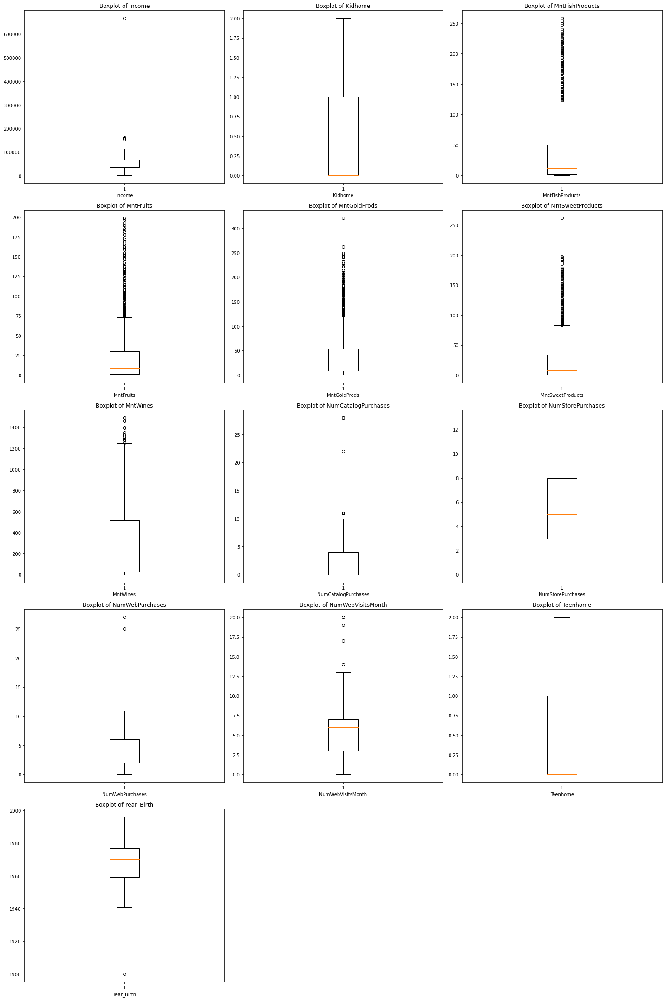

In [42]:
numerical_cols = workdf.select_dtypes(include=['number']).columns
numerical_cols = numerical_cols.difference(labels)  


num_cols = 3  
num_rows = (len(numerical_cols) + num_cols - 1) // num_cols 
fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 6 * num_rows))

# Create boxplots
for i, col in enumerate(numerical_cols):
    row = i // num_cols
    col_index = i % num_cols
    axes[row, col_index].boxplot(workdf[col].dropna())
    axes[row, col_index].set_title(f'Boxplot of {col}')
    axes[row, col_index].set_xlabel(col)

# Hide any unused subplots
for i in range(len(numerical_cols), num_rows * num_cols):
    fig.delaxes(axes.flatten()[i])

plt.tight_layout()
plt.show()

There are many techniques to do outlier detection but we decided to use <span style="color:#1f77b4"> boxplots </span> . From the visualizations above, it can be observed that there are outliers, in some features more than in others. We decided to take a heuristic approach in handling the outliers, determining some thresholds based on our observations on the visualizations, and then drop them. The thresholds can be seen in the code snippet below which is very readable.

## 2.1.2 Handling the outliers

In [43]:

print(f"Number of records in the work dataframe before removing outliers: {len(workdf)}")
workdf = workdf[workdf['Year_Birth'] > 1920]
workdf = workdf[workdf['Income'] < 200000]
workdf = workdf[workdf['MntSweetProducts'] < 200]
workdf = workdf[workdf['NumWebVisitsMonth'] < 15]
workdf = workdf[workdf['MntGoldProds'] < 250]
workdf = workdf[workdf['NumCatalogPurchases'] < 15]
workdf = workdf[workdf['NumWebPurchases'] < 15]
workdf = workdf[workdf['MntWines'] < 1400]
print(f"Number of records in the work dataframe after removing outliers: {len(workdf)}")

Number of records in the work dataframe before removing outliers: 1476
Number of records in the work dataframe after removing outliers: 1459


## 2.2 Feature Engineering

In [47]:
# let's revisualize the features we have and their unique values, as we have done above
# but it a more disctincive way

# categorical features
categorical_cols = workdf.select_dtypes(include=['object', 'category']).columns
print("Categorical Features:")
print(categorical_cols)

#for col in categorical_cols:
#    print(f"Unique values in '{col}': {workdf[col].unique()}")

# numerical features
numerical_cols = workdf.select_dtypes(include=['number']).columns
#print("\nNumerical Features:")
#print(numerical_cols)

Categorical Features:
Index(['Dt_Customer', 'Education', 'Marital_Status'], dtype='object')


In [48]:
workdf['Dt_Customer'] = pd.to_datetime(workdf['Dt_Customer'], format='%d-%m-%Y', dayfirst=True)

workdf.loc[:, 'Days_Since_Joined'] = (workdf['Dt_Customer'] - workdf['Dt_Customer'].min()).dt.days

# Calculate the age of the customers
workdf['Age'] = 2024 - workdf['Year_Birth']

# Calculate the number of children
workdf['Num_Children'] = workdf['Kidhome'] + workdf['Teenhome']

# Calculate the total amount spent by the customer
workdf['Total_Amount_Spent'] = workdf['MntWines'] + workdf['MntFruits'] + workdf['MntFishProducts'] + workdf['MntSweetProducts'] + workdf['MntGoldProds']


In [49]:
labels

['NumDealsPurchases',
 'AcceptedCmp1',
 'AcceptedCmp2',
 'AcceptedCmp3',
 'AcceptedCmp4',
 'AcceptedCmp5',
 'Response',
 'Complain',
 'Recency']

In [50]:
# Remove the old ones
workdf = workdf.drop(columns=['Year_Birth', 'Dt_Customer'])

In [51]:
workdf.shape

(1459, 27)

#### Feature Engineering steps: 

We undertook multiple feature engineering steps in order to come up with the best possible features. The ones that resulted the best were those that can be observed in the code snippet above. To elaborate: 

- Dt_Customer was a string and we converted that to the date/time format and decided to construct the  <span style="color:#1f77b4"> Days_Since_Joined </span> feature instead. We hypothesised this would be an important feature in understanding customers of a store and their probability of accepting offers, making complaints etc. 

- Instead of using the year of birth, we decided instead to use the calculated  <span style="color:#1f77b4"> Age </span> of the customers. We did this in order to improve readibility and interpretability, given that  the year of birth is essentially a linear transformation of age (given the current year) and using age directly simplifies the data and makes the model more straightforward.

- Furthermore, we decided to create another feature called  <span style="color:#1f77b4"> Num_Children </span> that combines information from both dimensions kidhome and teenhome.

- Last but not least, we decided to build a feature called <span style="color:#1f77b4"> Total_Amount_Spent </span> whose importance is quite intuitive. Given that we are interested in analyzing and clustering customer behaviour in a store, the total amount they spend might be a relevant dimension, instead of focusing in amount spent in particular subgroups.

In [52]:
#workdf.head()

## 2.3 Encoding of Categorical Data:

In [53]:
# revisiting the unique values of Education and Martial_Status
print("Unique values in 'Education':", workdf['Education'].unique())

print("Unique values in 'Marital_Status':", workdf['Marital_Status'].unique())

Unique values in 'Education': ['Graduation' 'Master' '2n Cycle' 'PhD' 'Basic']
Unique values in 'Marital_Status': ['Together' 'Single' 'Divorced' 'Married' 'Widow' 'Alone' 'YOLO' 'Absurd']


In [54]:

education_counts = workdf['Education'].value_counts()
print("Counts for each unique value in 'Education':\n", education_counts)

marital_status_counts = workdf['Marital_Status'].value_counts()
print("Counts for each unique value in 'Marital_Status':\n", marital_status_counts)

Counts for each unique value in 'Education':
 Graduation    748
PhD           310
Master        239
2n Cycle      128
Basic          34
Name: Education, dtype: int64
Counts for each unique value in 'Marital_Status':
 Married     551
Together    390
Single      310
Divorced    157
Widow        46
Alone         3
Absurd        1
YOLO          1
Name: Marital_Status, dtype: int64


In [55]:

education_level_mapping = {
    'PhD': 'High',
    'Master': 'High',
    'Graduation': 'Graduation',
    '2n Cycle': 'High',
    'Basic': 'Basic',
}


workdf['Education'] = workdf['Education'].map(education_level_mapping)

education_level_counts = workdf['Education'].value_counts()
print("Counts for each level in 'Education_Level':\n", education_level_counts)

marital_status_level_mapping = {
    'Married': 'Committed',
    'Together': 'Committed',
    'Single': 'Single',
    'Divorced': 'Single',
    'Widow': 'Single',
    'Alone': 'Single',
    'Absurd': 'Other',
    'YOLO': 'Other',
}

workdf['Marital_Status'] = workdf['Marital_Status'].map(marital_status_level_mapping)


marital_status_level_counts = workdf['Marital_Status'].value_counts()
print("Counts for each level in 'Marital_Status_Level':\n", marital_status_level_counts)

Counts for each level in 'Education_Level':
 Graduation    748
High          677
Basic          34
Name: Education, dtype: int64
Counts for each level in 'Marital_Status_Level':
 Committed    941
Single       516
Other          2
Name: Marital_Status, dtype: int64


#### More feature Engineering on Categorical Data: 

Given the unique values in Education and Marital Status, which are not very uniform in terms of following a strict (or widely-recognized) encoding analytical model, but rather combine multiple notions and also present strange and nonsensical values, we decided to take a greedy approach, try multiple reconstruction of features, test their impact on the pc-s and then determine the optimal one. As it can be observed in the code snippets above, the optimal ones were:

#### 1. Education: 
We decided to construct three classes: 
- high (Phd, masters, 2nd cycle grouped together)
- graduation
- basic. 

#### 2. Marital Status: 
We decided to construct also here three classes:
- commited (grouping together married & together)
- single ( grouping together single, divorced, widow, alone)
- other ( grouping together yolo, absurd). 

In fact, intuitively, we first decided to drop the nonsensical values "yolo" and "absurd" and "alone" but the observed impact was the first 2 pcs explained more of the variance with these rows present than amiss. This is a surprising result that might have to be studied further.



In [56]:
Xworkdf = workdf.copy()
Xworkdf = Xworkdf.drop(columns=labels)

In [57]:
workdf.shape, Xworkdf.shape

((1459, 27), (1459, 18))

In [58]:
# one-hot encoding
Xworkdf = pd.get_dummies(Xworkdf, columns=['Education', 'Marital_Status'])
print("Shape of the encoded DataFrame:", Xworkdf.shape)
Xworkdf.head()

Shape of the encoded DataFrame: (1459, 22)


,Income,Kidhome,MntFishProducts,MntFruits,MntGoldProds,MntSweetProducts,MntWines,NumCatalogPurchases,NumStorePurchases,NumWebPurchases,...,Days_Since_Joined,Age,Num_Children,Total_Amount_Spent,Education_Basic,Education_Graduation,Education_High,Marital_Status_Committed,Marital_Status_Other,Marital_Status_Single
1059,67605.0,0,184,28,54,54,336,8,6,2,...,244,37,0,656,0,1,0,1,0,0
1707,52117.0,0,30,10,20,0,112,2,4,5,...,17,59,1,172,0,1,0,1,0,0
2231,44802.0,0,13,10,20,10,853,4,12,9,...,22,54,0,906,0,0,1,0,0,1
2210,41769.0,0,32,29,27,0,302,1,7,8,...,198,69,1,390,0,0,1,0,0,1
415,75865.0,0,156,0,12,0,483,5,10,3,...,609,81,0,651,0,0,1,1,0,0


### Categorical Variables Encoding: 

There are multiple techniques to do categorical variables encoding which is necessary to construct the PCA. For the purposes of this task, we chose one-hot encoding. One-hot encoding maintains equal distances between all categories, preventing any misleading interpretations, which is crucial for the PCA and Clustering. 

### Summarize the final version of the dataset transformation: 

#### A. Features:

**25 features (from part 1)** -> (drop 'Year_Birth', 'Dt_Customer') -> **23 features** -> (add the newly created features 'Age', 'Num_Children', 'Total_Amount_Spent', 'Days_Since_Joined') -> **27 features** -> (drop labels) -> **18 features** -> (categorical data grouping + one hot encoding: 3 features for education and 3 features for marital_status) -> **24 features** -> (drop the original education, marital_status) -> **22 features**

#### B. Rows: 

**1476 rows (from part 1)** -> (removing outliers) -> **1459 rows** 

### <span style="color: green;"> In the end, the final dimensions of our dataset, which is in fact a matrix, will be the following: 1459x22. These will be used to build the PCA. </span>



# <center> <span style="color:red"> 3. Scaling and the PCA </span> </center>

## 3.1 Scaling

In [59]:
# StandardScaler
scaler_std = StandardScaler()
Xworkdf_std_array = scaler_std.fit_transform(Xworkdf)
Xworkdf_std = pd.DataFrame(Xworkdf_std_array, columns=Xworkdf.columns, index=Xworkdf.index)

# MinMaxScaler
scaler_mm = MinMaxScaler(feature_range=(0, 1))
Xworkdf_mm_array = scaler_mm.fit_transform(Xworkdf)
Xworkdf_mm = pd.DataFrame(Xworkdf_mm_array, columns=Xworkdf.columns, index=Xworkdf.index)

In [60]:
original_variances = Xworkdf.var()
standard_scaled_variances = pd.DataFrame(Xworkdf_std, columns=Xworkdf.columns).var()
minmax_scaled_variances = pd.DataFrame(Xworkdf_mm, columns=Xworkdf.columns).var()


variances_df = pd.DataFrame({
    'Original Variances': original_variances,
    'Standard Scaled Variances': standard_scaled_variances,
    'MinMax Scaled Variances': minmax_scaled_variances
})


variances_df

,Original Variances,Standard Scaled Variances,MinMax Scaled Variances
Income,4.390600e+08,1.000686,0.017390
Kidhome,2.889872e-01,1.000686,0.072247
MntFishProducts,3.084340e+03,1.000686,0.046336
MntFruits,1.533402e+03,1.000686,0.038721
MntGoldProds,2.591596e+03,1.000686,0.041799
MntSweetProducts,1.600488e+03,1.000686,0.040825
MntWines,1.108074e+05,1.000686,0.056859
NumCatalogPurchases,7.679643e+00,1.000686,0.063468
NumStorePurchases,1.055362e+01,1.000686,0.062447
NumWebPurchases,7.225576e+00,1.000686,0.059716


#### Observations: 

From the above dataframe we can observe that the original variances have substantial differences among each other. The dimensions with the highest variances are the following: 
- Income                
- Total_Amount_Spent    
- MntWines              
- Days_Since_Joined     

We can denote that particularly the numerical variables have a very high variance and the categorical features not really, and this could be due to one hot encoding. Thus, we might be missing out the important information that categorical features hold and some sort of scaling becomes of imperative importance.


After applying the standard scaling, as expected, all the variances become almost 1. 

After applying the min-max scaler, all the variances appear to be closer to 0 and are closer to one-another. In this setting, the features with the highest variances are: 
- Education_Graduation	
- Education_High
- Marital_Status_Committed
- Marital_Status_Single

These are the dimensions created out of the categorical features, after one-hot encoding was applied. It appears they carry a substantial "weight" in our dataset. 


## 3.2 THE PCA

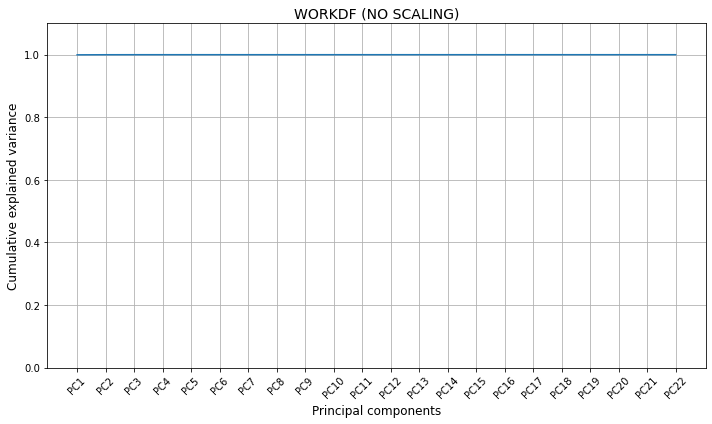

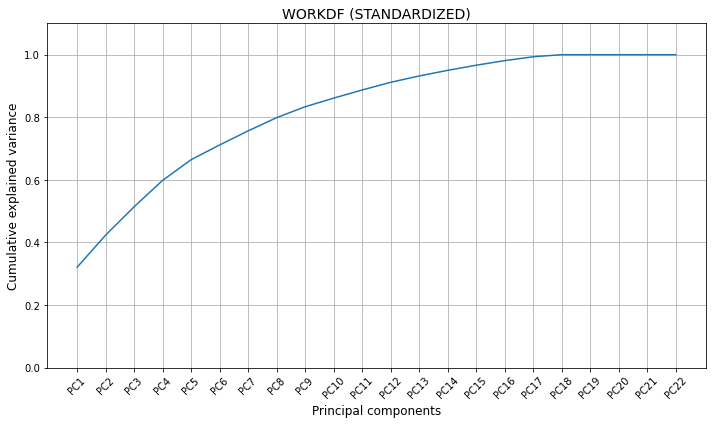

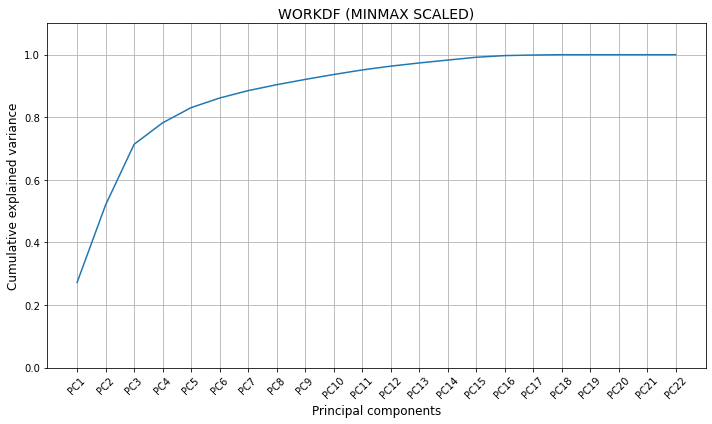

In [61]:

pca_workdf = PCA()
pca_workdf_std = PCA()
pca_workdf_mm = PCA()

pca_workdf.fit(Xworkdf)
pca_workdf_std.fit(Xworkdf_std)
pca_workdf_mm.fit(Xworkdf_mm)

# Plotting function
def plot_cumulative_variance(pca, title):
    plt.figure(figsize=(10, 6))
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.title(title, fontsize=14) 
    plt.ylim([0, 1.1])
    plt.xticks(ticks=np.arange(pca.components_.shape[1]), 
               labels=[f'PC{i + 1}' for i in range(pca.components_.shape[1])],
               rotation=45) 
    plt.xlabel('Principal components', fontsize=12) 
    plt.ylabel('Cumulative explained variance', fontsize=12)
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Plot cumulative explained variance for each dataset
plot_cumulative_variance(pca_workdf, 'WORKDF (NO SCALING)')
plot_cumulative_variance(pca_workdf_std, 'WORKDF (STANDARDIZED)')
plot_cumulative_variance(pca_workdf_mm, 'WORKDF (MINMAX SCALED)')

#### Observations: 

As it can be observed in the graphs above, in the first case, all it takes is 1 principal component to explain immediately 100% of the variance and the curve of cummulative explained variance is a straight line. In an unscaled dataset, the features may have different units or ranges of values and thus one feature, the feature with the largest variance (in absolute terms) might dominate the first principal component. 

In the case of the two preprocessed, scaled dataframes, the speed of growth is much higher when the dataframe had min-max scaling as opposed to standard scaling. This is an expected result given that in the standard scaling case, all features have the same variance, thus the PCA algorithm needs more pc-s in order to reach a higher level of cummulative explained variance.

# <center> <span style="color:red">  4. Dimensionality Reduction and Interpretation of the PCs </span> </center>

## 4.1 Bar plot of explained variance for both Xworkdf_std and Xworkdf_mm and find the m for each

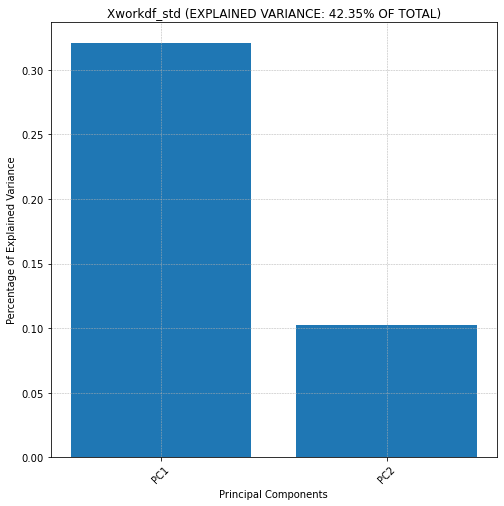

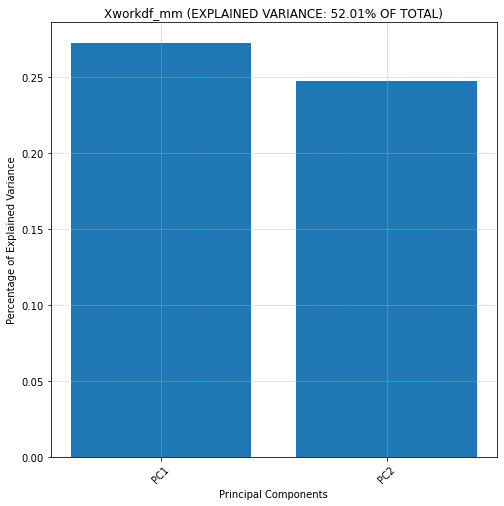

In [62]:

def find_m_and_plot(X, title):
  
    pca_temp = PCA().fit(X)
    cumulative_variance = np.cumsum(pca_temp.explained_variance_ratio_)
    m1 = np.where(cumulative_variance >= 0.33)[0][0] + 1  # Index where cumulative variance first exceeds 33%
    

    m = min(m1, 5)
    pca = PCA(n_components=m)
    pca.fit(X)
    
    plt.figure(figsize=(8, 8),)
    plt.bar(range(1, m+1), pca.explained_variance_ratio_)
    plt.title(f"{title} (EXPLAINED VARIANCE: {np.round(pca.explained_variance_ratio_.sum() * 100, 2)}% OF TOTAL)")
    plt.xticks(ticks=np.arange(1, m+1), labels=[f'PC{i}' for i in range(1, m+1)], rotation=45)
    plt.xlabel('Principal Components')
    plt.ylabel('Percentage of Explained Variance')
    plt.grid(True, which='both', linestyle='--', linewidth=0.5)

    plt.show()

    return pca

pca_std =  find_m_and_plot(Xworkdf_std, "Xworkdf_std")
pca_mm  =  find_m_and_plot(Xworkdf_mm, "Xworkdf_mm")


### Observations:

#### In the Xworkdf_std case: 
The first two principal components explain jointly 42.35% of the total variance, with the majority of explained variance hinging upon PC1 with over 30%.

#### In the Xworkdf_mm case:
The first two principal components explain jointly 52.01% of the total variance, thus more than half of the total variance by using just 2/22 components. In this case, the explained variance is more evenly distributed among the two components, with pc1 having only a slightly higher value.


## 4.2 Interpretation

### 4.2.1. Standard PCA1 and PCA2

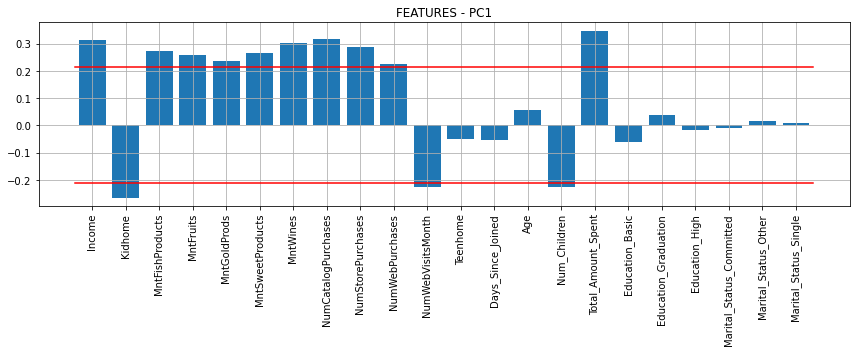


**
PC1
HIGH-VALUED POSITIVE COMPONENTS: ['Income', 'MntFishProducts', 'MntFruits', 'MntGoldProds', 'MntSweetProducts', 'MntWines', 'NumCatalogPurchases', 'NumStorePurchases', 'NumWebPurchases', 'Total_Amount_Spent']
HIGH-VALUED NEGATIVE COMPONENTS: ['Kidhome', 'NumWebVisitsMonth', 'Num_Children']
***********



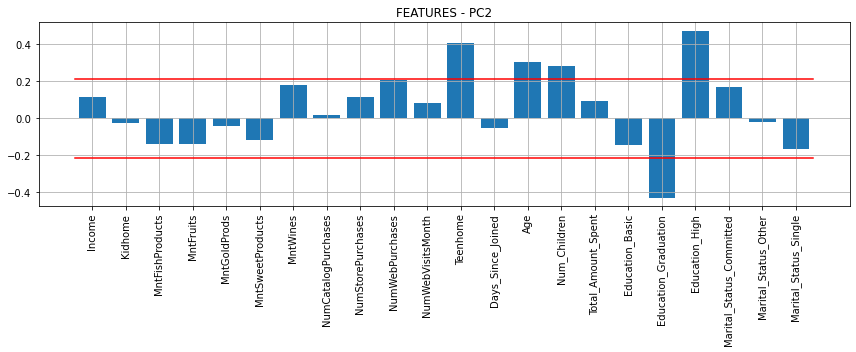


**
PC2
HIGH-VALUED POSITIVE COMPONENTS: ['Teenhome', 'Age', 'Num_Children', 'Education_High']
HIGH-VALUED NEGATIVE COMPONENTS: ['Education_Graduation']
***********



In [63]:
eps = np.sqrt(1 / pca_std.n_features_in_)

for ii in range(2):
    plt.figure(figsize=(12, 5))
    plt.bar(Xworkdf_std.columns, pca_std.components_[ii, :])
    # RED LINE DENOTING THE THRESHOLD [-eps, eps]
    plt.plot([-0.5, pca_std.n_features_in_ - 0.5], [eps, eps], 'r')  # Corrected
    plt.plot([-0.5, pca_std.n_features_in_ - 0.5], [-eps, -eps], 'r')  # Corrected
    plt.xticks(ticks=np.arange(pca_std.n_features_in_), rotation=90)
    plt.title(f'FEATURES - PC{ii + 1}')
    plt.grid(zorder=0)
    plt.tight_layout()
    plt.show()
    # THE SELECTION OF THE FEATURES WITH CONTRIBUTE GREATER THAN THE THRESHOLD
    ind_great_pos_PCii = np.argwhere(pca_std.components_[ii, :] >= eps).flatten()
    ind_great_neg_PCii = np.argwhere(pca_std.components_[ii, :] < -eps).flatten()
    great_pos_PCii = [Xworkdf_std.columns[i] for i in ind_great_pos_PCii]
    great_neg_PCii = [Xworkdf_std.columns[i] for i in ind_great_neg_PCii]
    print('\n**')
    print(f'PC{ii+1}')
    print(f'HIGH-VALUED POSITIVE COMPONENTS: {great_pos_PCii}')
    print(f'HIGH-VALUED NEGATIVE COMPONENTS: {great_neg_PCii}')
    print('***********\n')

#### Observations: 

##### For PC1:
It can be observed that the main positively contributing features are those related to spending, weather that is the total amount spent or amount spent in particular categories. The same goes for income and  we denote for simplicity: Am_Purchased&Income(+). The family related features like: KidHome and Num_Children are the ones to contribute negatively. Furthermore, also Number of web visits per month and number of children and kid at home appear to largely impact the pc negatively. The rest appear to have not much impact. 

##### For PC2:
Features with a high positive impact: teenhome, education high. 
Features with a high negative impact: education graduation. 
All of these are categorical features, whose variances, were we to use the original dataset without scaling, would have been dismissed. But now they appear to have a substantial amount of information in the pcs in the scaled version of the dataset.

In [64]:
pc_names_std = ['Children&WebVisits(-) vs Am_Purchased&Income(+)', 'TeenHome&Edu_High (+) vs.Edu_Graduation(-)']

## 4.2.2 MinMax PC1 and PC2

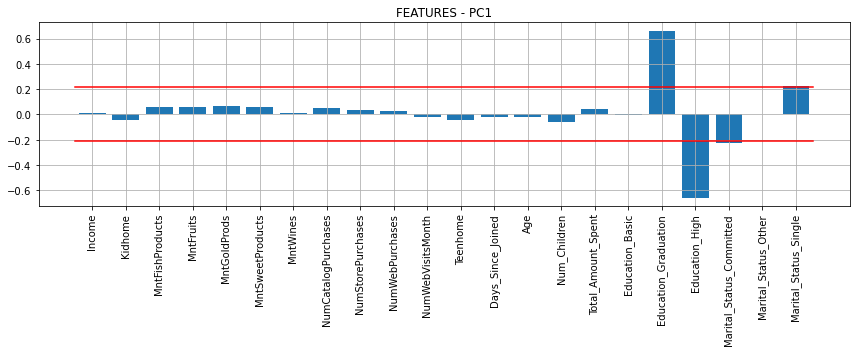


**
PC1
HIGH-VALUED POSITIVE COMPONENTS: ['Education_Graduation', 'Marital_Status_Single']
HIGH-VALUED NEGATIVE COMPONENTS: ['Education_High', 'Marital_Status_Committed']
***********



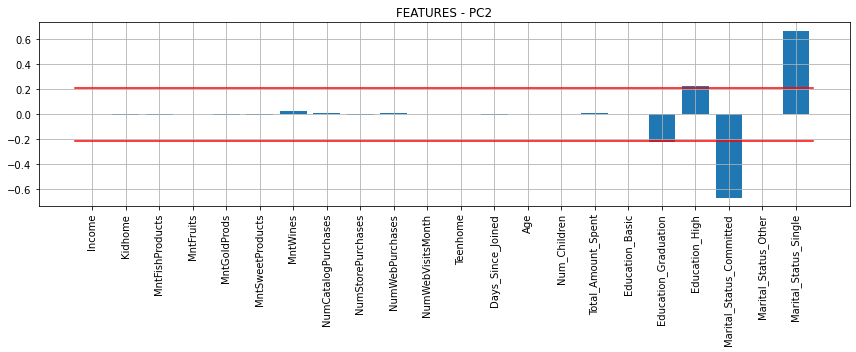


**
PC2
HIGH-VALUED POSITIVE COMPONENTS: ['Education_High', 'Marital_Status_Single']
HIGH-VALUED NEGATIVE COMPONENTS: ['Education_Graduation', 'Marital_Status_Committed']
***********



In [65]:
eps = np.sqrt(1 / pca_mm.n_features_in_)

for ii in range(2):
    plt.figure(figsize=(12, 5))
    plt.bar(Xworkdf_mm.columns, pca_mm.components_[ii, :])
    # RED LINE DENOTING THE THRESHOLD [-eps, eps]
    plt.plot([-0.5, pca_mm.n_features_in_ - 0.5], [eps, eps], 'r')
    plt.plot([-0.5, pca_mm.n_features_in_ - 0.5], [-eps, -eps], 'r')
    plt.xticks(ticks=np.arange(pca_mm.n_features_in_), rotation=90)
    plt.title(f'FEATURES - PC{ii + 1}')
    plt.grid(zorder=0)
    plt.tight_layout()
    plt.show()
    # THE SELECTION OF THE FEATURES WITH CONTRIBUTE GREATER THAN THE THRESHOLD
    ind_great_pos_PCii = np.argwhere(pca_mm.components_[ii, :] >= eps).flatten()
    ind_great_neg_PCii = np.argwhere(pca_mm.components_[ii, :] < -eps).flatten()
    great_pos_PCii = [Xworkdf_mm.columns[i] for i in ind_great_pos_PCii]
    great_neg_PCii = [Xworkdf_mm.columns[i] for i in ind_great_neg_PCii] 
    print('\n**')
    print(f'PC{ii+1}')
    print(f'HIGH-VALUED POSITIVE COMPONENTS: {great_pos_PCii}')
    print(f'HIGH-VALUED NEGATIVE COMPONENTS: {great_neg_PCii}')
    print('***********\n')

#### Observations: 

The min-max scaled dataset and the pcs build upon it, appear very differently from the standardized version, in the sense that here we have very dominant features and the rest appear to be quite irrelevant. 

#### For PC1: 
Education Graduation is the only feature that surpasses the threshold of epsilon in terms of postive impact and it does in a very emphasised manner in comparison to the other features. In terms of negative impact, it is the education high feature.

#### For PC2:
In this case, the impact of the most part of the features is even more irrelevant than in the pc1 and the dominance of just a few features, is even more highlighted. For the high positive impact is Marital Status Single and for high negative impact is Martial Status Commited.

In [66]:

pc_names_mm = ['Edu_Graduation (+) vs. Edu_High(-)', 'Singles(+) vs. Committed(-)']

## 4.3 Score graphs

### 4.3.1 Label Transformation

#### We will try to understand the data in terms our labels: 

##### As a reminder our labels are: 
1. NumDealsPurchases: Number of purchases made with a discount
2. AcceptedCmp1: 1 if customer accepted the offer in the 1st campaign, 0 otherwise
3. AcceptedCmp2: 1 if customer accepted the offer in the 2nd campaign, 0 otherwise
4. AcceptedCmp3: 1 if customer accepted the offer in the 3rd campaign, 0 otherwise
5. AcceptedCmp4: 1 if customer accepted the offer in the 4th campaign, 0 otherwise
6. AcceptedCmp5: 1 if customer accepted the offer in the 5th campaign, 0 otherwise
7. Response: 1 if customer accepted the offer in the last campaign, 0 otherwise
8. Complain: 1 if the customer complained in the last 2 years, 0 otherwise
9. Recency: Number of days since customer’s last purchase

##### The new compound lables will be: 

1. Accepted_Campaingns: AcceptedCmp1 + AcceptedCmp2 + AcceptedCmp3 + AcceptedCmp4 + AcceptedCmp5 + Response
   Then, we initially consider a threshold of 0, for no accepted offers and 1 otherwise. Furthermore, we also consider the total    and thus have in this manner 6 possible groups. 
2. Ratios with regards to NumDealsPurchases: we tried to better understand this label by considering it in terms of other      features, such as: Number of Web Purchases, Number of Catalog Purchases and Number of Store Purchases. 
3. Ratio of Recency with DaysSinceJoined: this ratio informs us on the number of people that might have joined a long time ago and still recently purchased something, or those who have joined a long time ago, but have also not been active in buying in a long time, etc. 


##### Furthermore, we did some visualization of the labels frequency distributions, in order to gain a better understanding of the data.

In [67]:
workdf_cp = workdf.copy()

workdf_cp['Accepted_Campaigns'] = workdf_cp['AcceptedCmp1'] + workdf_cp['AcceptedCmp2'] + workdf_cp['AcceptedCmp3'] + workdf_cp['AcceptedCmp4'] + workdf_cp['AcceptedCmp5'] + workdf_cp['Response']
workdf_cp['Accepted_Campaigns'] = workdf_cp['Accepted_Campaigns'].map(lambda x: 1 if x > 0 else 0)

In [69]:
#Xworkdf_std.head()

In [82]:
Y_std = pca_std.transform(Xworkdf_std)

In [70]:
#Y_std

In [71]:
#workdf_cp.head()

In [72]:
workdf_cp['NumDealsPurchases'].unique()

array([ 1,  2,  6,  0,  4,  3,  5,  7, 12, 11,  9, 10,  8, 15, 13],
      dtype=int64)

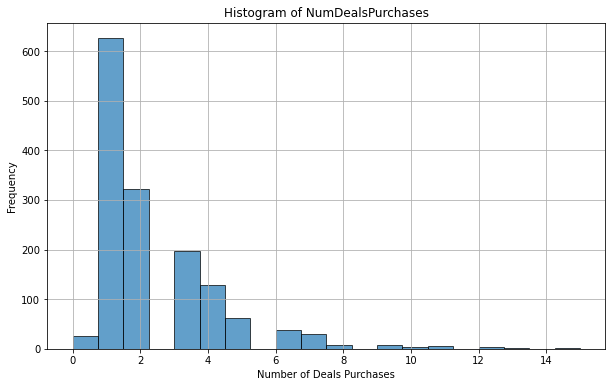

In [73]:
plt.figure(figsize=(10, 6))
plt.hist(workdf_cp['NumDealsPurchases'], bins=20, edgecolor='black', alpha=0.7)
plt.title('Histogram of NumDealsPurchases')
plt.xlabel('Number of Deals Purchases')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

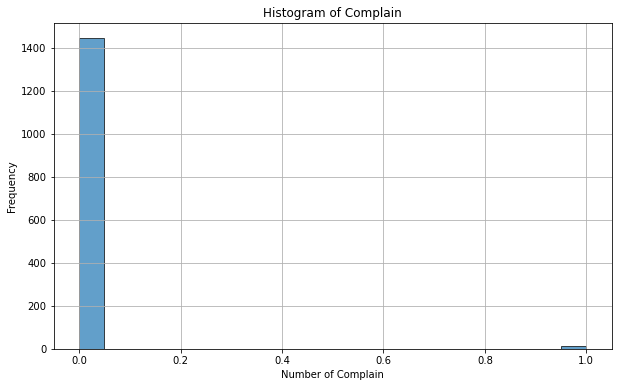

In [74]:
plt.figure(figsize=(10, 6))
plt.hist(workdf_cp['Complain'], bins=20, edgecolor='black', alpha=0.7)
plt.title('Histogram of Complain')
plt.xlabel('Number of Complain')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [75]:
(workdf_cp['Complain'] == 1).sum()

15

#### Observation: 

Considering the very low cardinality of people that complained, we decided to not analyze this label further. However, this could be interesting in another analysis, like outlier detection. However, here we have a clustering task and we have to find a way to best group all the data.

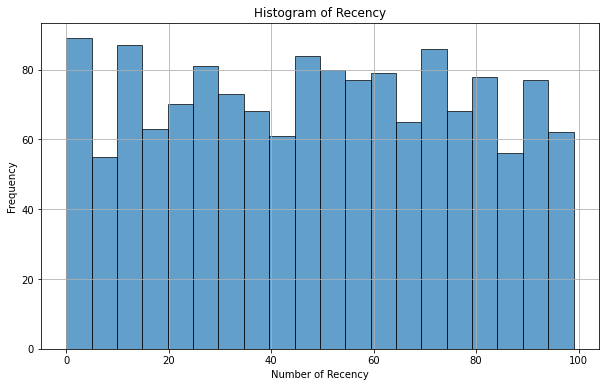

In [76]:
plt.figure(figsize=(10, 6))  
plt.hist(workdf_cp['Recency'], bins=20, edgecolor='black', alpha=0.7)
plt.title('Histogram of Recency')
plt.xlabel('Number of Recency')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

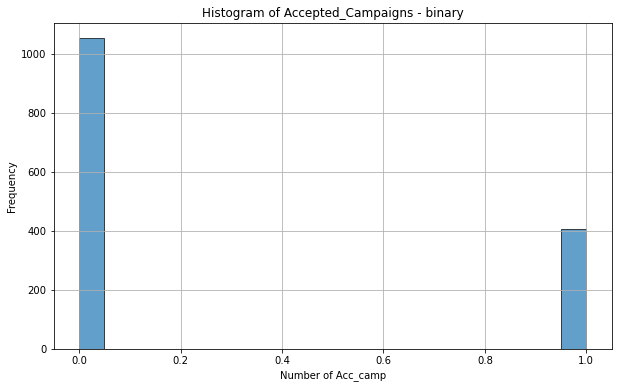

In [77]:
plt.figure(figsize=(10, 6)) 
plt.hist(workdf_cp['Accepted_Campaigns'], bins=20, edgecolor='black', alpha=0.7)
plt.title('Histogram of Accepted_Campaigns - binary')
plt.xlabel('Number of Acc_camp')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [78]:

workdf_cp['Accepted_Campaigns2'] = workdf_cp['AcceptedCmp1'] + workdf_cp['AcceptedCmp2'] + workdf_cp['AcceptedCmp3'] + workdf_cp['AcceptedCmp4'] + workdf_cp['AcceptedCmp5'] + workdf_cp['Response']

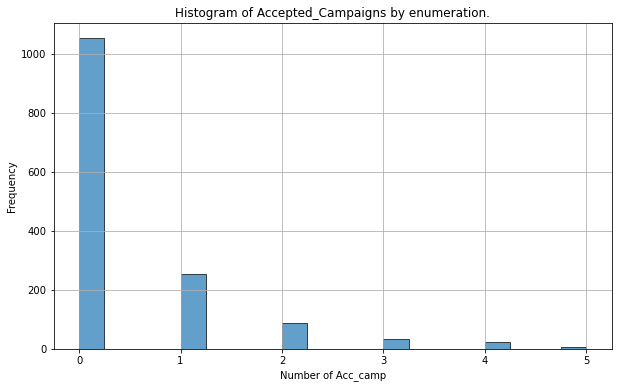

In [79]:
plt.figure(figsize=(10, 6)) 
plt.hist(workdf_cp['Accepted_Campaigns2'], bins=20, edgecolor='black', alpha=0.7)
plt.title('Histogram of Accepted_Campaigns by enumeration.')
plt.xlabel('Number of Acc_camp')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

### Overall Observations:

- The labels have very unbalanced distributions, with the exception of Recency.
- For most labels, with the exception of Recency, the larger number of values is close to 0 or 0.


#### From the histograms, we decided to proceed with builiding the score graphs of our data transformed in the space build by the pc-s through only these labels: 

- Accepted_Campaigns (in both versions).
- NumDealPurchases - the three ratios built. 
- Recency - as a standalone and the ratio with respect to DaysSinceJoined.

## 4.3.2 Score graphs for Xworkdf_std:

### A. Standardized: Accepted Campaigns in two different configurations.

In [83]:
set1 = cm.Set1.colors
genpos = workdf_cp['Accepted_Campaigns']. unique()
genpos_colors = {genpos[i]:set1[i] for i in range(len(genpos))}
workdf_cp['color'] = [genpos_colors[t] for t in workdf_cp['Accepted_Campaigns'].values]
genpos_colors_legend = [Line2D([0], [0], color=genpos_colors[k]) for k in genpos_colors.keys()]
color = {1: 'green', 0: 'red'}
colors = ['green', 'red']
colors_legend = [Line2D([0], [0], color=color[k]) for k in color.keys()]

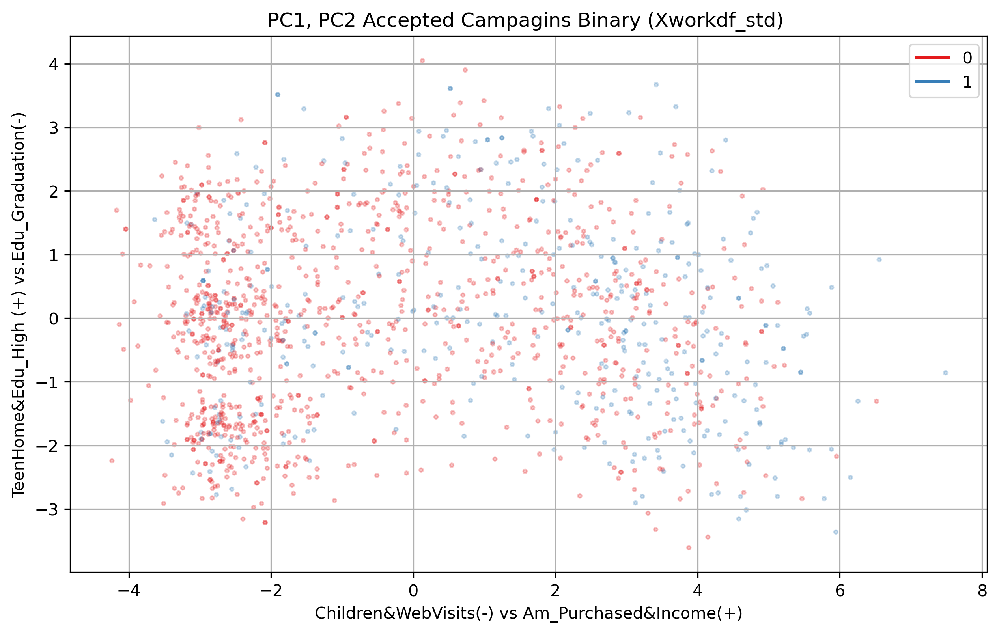

In [84]:
plt.figure(figsize=(10, 6), dpi = 300)
plt.scatter(Y_std[:,0], Y_std[:,1], s=5, c=workdf_cp['color'].values, alpha =0.25)
plt.title('PC1, PC2 Accepted Campagins Binary (Xworkdf_std) ') 
plt.legend (genpos_colors_legend, [k for k in genpos_colors.keys()]) 
plt. xlabel (pc_names_std[0])
plt.ylabel(pc_names_std[1])
plt.grid(zorder=0)
plt.show()

#### Observations: 

Given the fact that this is a store, in the end its purpose while making offers to customers is for them to consume, thus, to accept the offer and to purchase. We tried, by getting the total of accepted offers and then determing a binary threshold 0 and 1, to understand what kind of customers, based on their mapping in the principal components, are the ones that accept the offers. This could be potentially useful to the store managers to deliver more campaigns to similar demographics. However, as it can be observed in the graph above, there is no clear pattern using the score graph. When we visualized the histogram of the non-mapped total accepted feature, we understood that there is a wide majority of people that did not accept the offers, so we have a very unbalanced dataset, as it was seen also in the histogram w.r.t this label. Thus, we decided to take a futher step in the analysis and eliminate those 0 entries, in order to de-clutter the visualization and potentially understand better those customers that do accept the offers. 

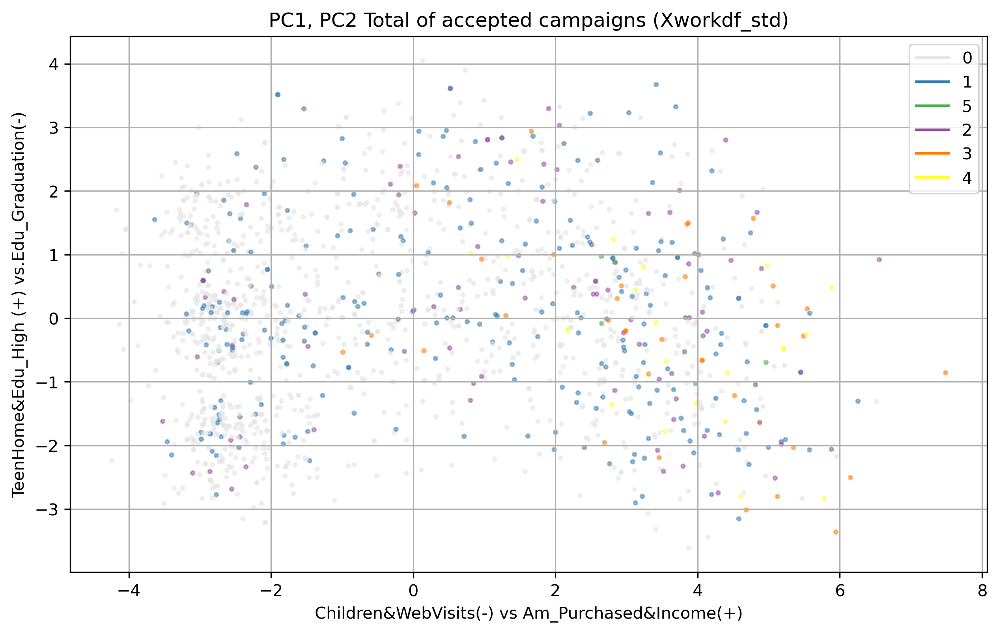

In [85]:
set1 = cm.Set1.colors
genpos = workdf_cp['Accepted_Campaigns2'].unique()

genpos_colors = {genpos[i]: set1[i] for i in range(len(genpos))}
genpos_colors[0] = '#E5E5E5'  # Set the color for 0 values

workdf_cp['color'] = [genpos_colors[t] for t in workdf_cp['Accepted_Campaigns2'].values]

genpos_colors_legend = [Line2D([0], [0], color=genpos_colors[k]) for k in genpos_colors.keys()]

# Plotting
plt.figure(figsize=(10, 6), dpi = 300)
plt.scatter(Y_std[:,0], Y_std[:,1], s=5, c=workdf_cp['color'].values, alpha=0.5)
plt.title('PC1, PC2 Total of accepted campaigns (Xworkdf_std)')
plt.legend(genpos_colors_legend, [k for k in genpos_colors.keys()])
plt.xlabel(pc_names_std[0])
plt.ylabel(pc_names_std[1])
plt.grid(zorder=0)
plt.show()

#### Observations: 

We tried to gray out the points which had 0 as a value in terms of accepted_campaigns, given that they were the majority and also not the interest of this sub-analysis. Looking at the graph in a different level of granularity with respect to accepted campaigns, so all the values from 1 to 5, inclusive, we can observe that: 

- There is no clear positioning in the space composed of PC1 and PC2 of the labels with 1 and 2 accepted offers. 
- However, we can note that the customers that have accepted 3 or more offers, are those that can be interpreted through PC1. The higher is the PC1 value, we have customers with high income and amount purchased and a low number of children and website visits. Specifically, we have that: 
     - The customers that have accepted 3 offers are mostly with PC1 bigger than 0. 
     - The customers that have accepted 4 offers are mostly with PC1 bigger than 1. 
     - The customers that have accepted 5 offers are mostly with PC1 bigger than 3. 


This is an expected result, so those customers that will accept more offers are those that in general have a higher income and purchase more in the store. 
With regards to PC2, the data are quite spread and thus uninterpretable. 

### B. Standardized: Recency

In [86]:
workdf_cp['Recency'].unique()

array([84, 55, 71, 31, 73, 51, 12, 45, 43, 62, 17, 49,  6, 70, 20, 18, 39,
        3, 29, 68, 91, 56, 98, 19, 10, 89, 54, 48, 34, 86, 83, 63, 97, 85,
       47, 88, 42, 81, 15, 64, 69, 80, 30, 82,  1, 57, 26,  4, 14, 27, 87,
       24, 35, 16, 93, 72, 13, 23, 11, 74, 25, 77,  8, 92, 36, 79, 52, 94,
       32, 67, 65,  7, 33,  2, 28, 61, 60, 99, 50, 21, 40,  0, 78, 76, 75,
       46, 53, 37, 90, 66, 95, 38,  5, 41, 58, 59, 22, 44, 96,  9],
      dtype=int64)

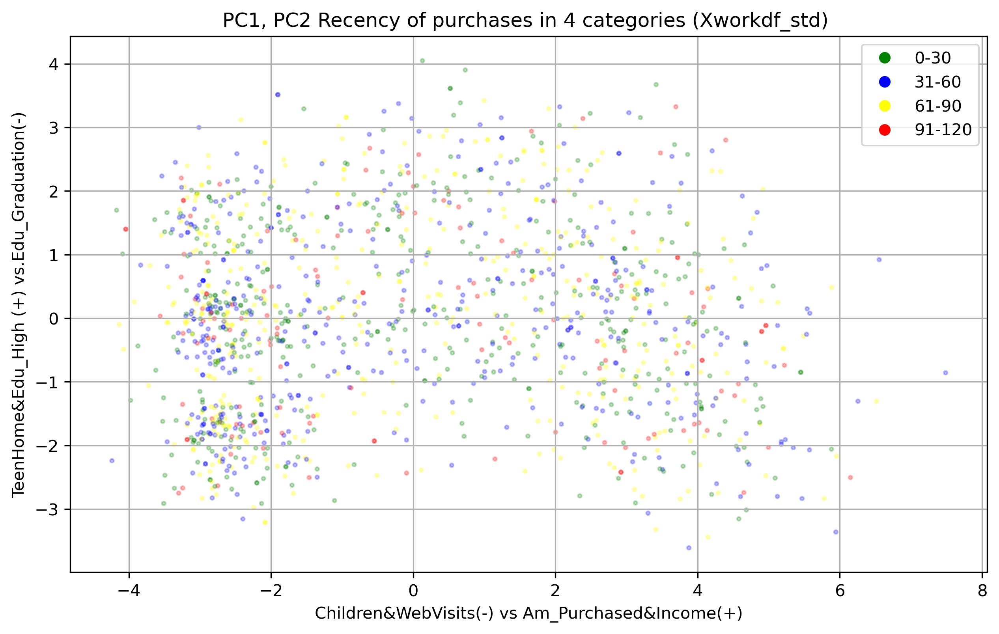

In [87]:
bins = [0, 30, 60, 90, 120]  #TODO WE CAN CHANGE THE BINS
labels = ['0-30', '31-60', '61-90', '91-120']
workdf_cp['RecencyRange'] = pd.cut(workdf_cp['Recency'], bins=bins, labels=labels, right=False)

range_colors = {
    '0-30': 'green',
    '31-60': 'blue',
    '61-90': 'yellow',
    '91-120': 'red'
}

workdf_cp['color'] = workdf_cp['RecencyRange'].map(range_colors)

# Create legend items for the ranges
legend_items = [Line2D([0], [0], color=color, marker='o', linestyle='', label=label) for label, color in range_colors.items()]


plt.figure(figsize=(10, 6), dpi = 300)
plt.scatter(Y_std[:,0], Y_std[:,1], s=5, c=workdf_cp['color'].values, alpha =0.25)
plt.title('PC1, PC2 Recency of purchases in 4 categories (Xworkdf_std) ') 
plt.legend (handles=legend_items) 
plt. xlabel (pc_names_std[0])
plt.ylabel(pc_names_std[1])
plt.grid(zorder=0)
plt.show()

#### Observations: 

As it can be observed in the scatterplot above, there are no clear groups or trends that can be denoted using the two principal components through the "recency" label. We attempted different thresholds of the feature but that did not improve the visualization output. Thus, it can be concluded that this particular label cannot be analyzed properly through the principal components made with the selected features and the standard scaled dataset. Other and futher analysis would be required to understand it properly. 

In [88]:
# continous loyal customers -> 1: not so loyal and continous; 0 - loyal & cont.
workdf_cp['Recency_Ratio_DaysSinceJoined'] = workdf_cp['Recency'] /  workdf_cp['Days_Since_Joined']
workdf_cp['Recency_Ratio_DaysSinceJoined'] = workdf_cp['Recency_Ratio_DaysSinceJoined'].map(lambda x: 1 if x > 0.5 else 0)


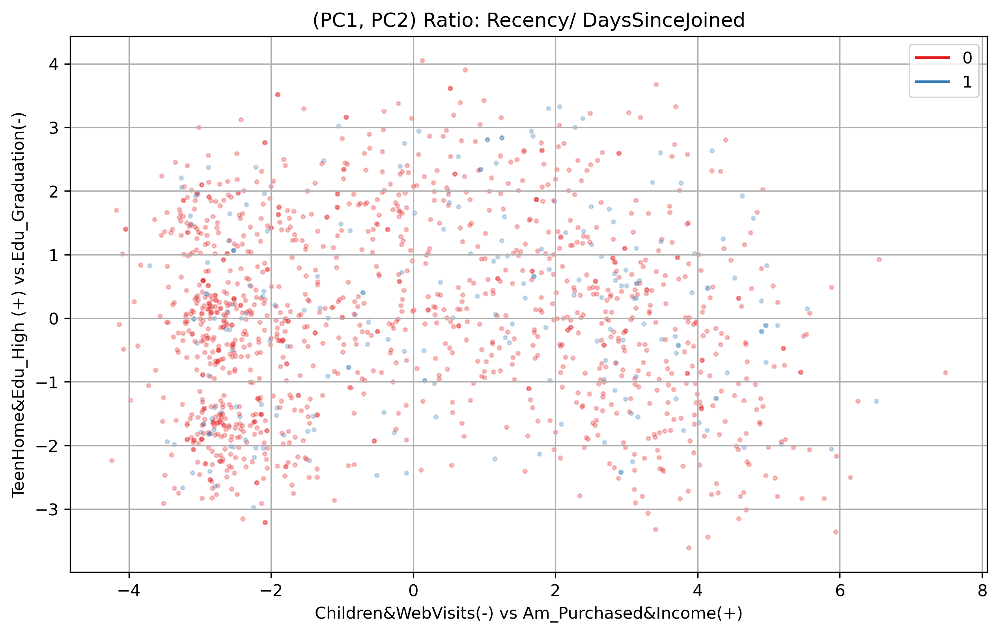

In [89]:
set1 = cm.Set1.colors
genpos = workdf_cp[ 'Recency_Ratio_DaysSinceJoined'].unique()
genpos_colors = {genpos[i]:set1[i] for i in range(len(genpos))}
workdf_cp['color'] = [genpos_colors[t] for t in workdf_cp[ 'Recency_Ratio_DaysSinceJoined'].values]
genpos_colors_legend = [Line2D([0], [0], color=genpos_colors[k]) for k in genpos_colors.keys()]

plt.figure(figsize=(10,6), dpi = 300)
plt.scatter(Y_std[:,0], Y_std[:,1], s=5, c=workdf_cp['color'].values, alpha =0.25)
plt.title('(PC1, PC2) Ratio: Recency/ DaysSinceJoined') 
plt.legend (genpos_colors_legend, [k for k in genpos_colors.keys()]) 
plt. xlabel (pc_names_std[0])
plt.ylabel(pc_names_std[1])
plt.grid()
plt.show()

### Observations: 

We tried to understand the recency label with respect to "days since joined" feature, that is the number of days since the customer joined the store. Then, we determined a threshold to have only two classes 1 and 0. We tested different thresholds. However, as it can be observed in the score graph above, there is no clear distinct pattern.

### C. Standardized: NumDeals & Ratios of NumDeals

As mentioned above, we tried to understand the label "Number of Deals Purchases", so number of purchases made with a discount, with respect to the features: 
1. Number of Web Purchases
2. Number of Catalog Purchases
3. Number of Store Purchases

By constructing ratios.However, we have to be attentive for the fact that we are "informing" the labels with "information" held in the features. We tried to divide the data in two classes 1 and 0 and the threshold that does this division is the mean of the respective columns.

In [90]:
workdf_cp['Deal_Purchase_Ratio_WebPurch'] = np.where(
    workdf_cp['NumWebPurchases'] == 0,
    1,  # Value to assign when NumWebPurchases is 0
    workdf_cp['NumDealsPurchases'] / workdf_cp['NumWebPurchases']  # Division otherwise
)

The bigger the ratio, the bigger the number of purchases done with deals and the smaller the number of web purchases.

In [91]:
mean_deal_web = workdf_cp['Deal_Purchase_Ratio_WebPurch'].mean()
mean_deal_web

0.7517341979473571

In [92]:
workdf_cp['Deal_Purchase_Ratio_WebPurch'] = workdf_cp['Deal_Purchase_Ratio_WebPurch'].map(lambda x: 1 if x > 0.75 else 0)

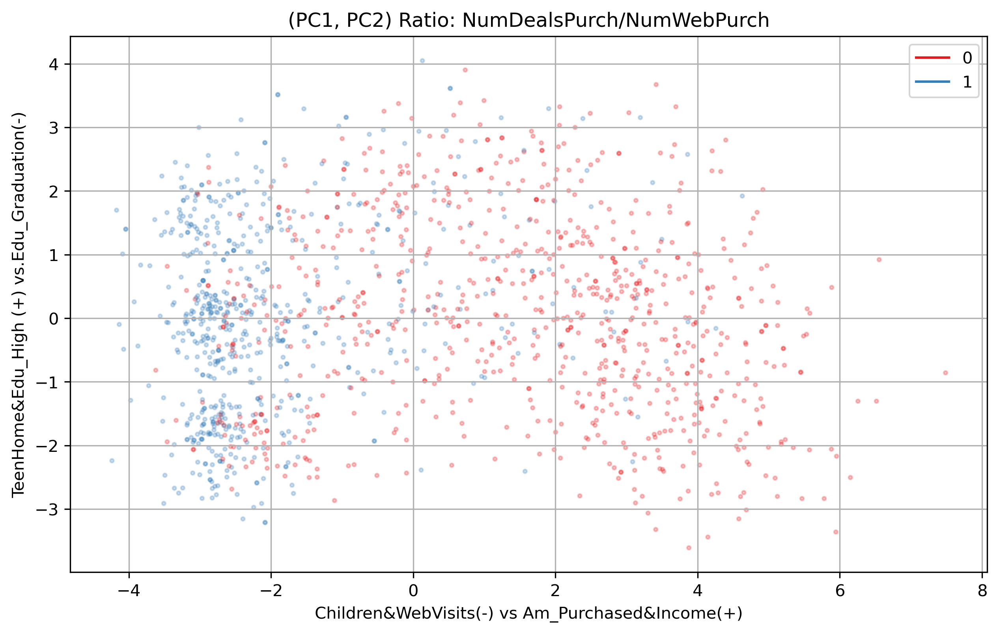

In [93]:
set1 = cm.Set1.colors
genpos = workdf_cp[ 'Deal_Purchase_Ratio_WebPurch'].unique()
genpos_colors = {genpos[i]:set1[i] for i in range(len(genpos))}
workdf_cp['color'] = [genpos_colors[t] for t in workdf_cp[ 'Deal_Purchase_Ratio_WebPurch'].values]
genpos_colors_legend = [Line2D([0], [0], color=genpos_colors[k]) for k in genpos_colors.keys()]

plt.figure(figsize=(10,6), dpi = 300)
plt.scatter(Y_std[:,0], Y_std[:,1], s=5, c=workdf_cp['color'].values, alpha =0.25)
plt.title('(PC1, PC2) Ratio: NumDealsPurch/NumWebPurch') 
plt.legend (genpos_colors_legend, [k for k in genpos_colors.keys()]) 
plt. xlabel (pc_names_std[0])
plt.ylabel(pc_names_std[1])
plt.grid()
plt.show()

### Observation: 

For this first ratio, we determine a threshold that is the mean value of the ratio and make it 1 if it is bigger than the mean and 0 otherwise. We can observe somewhat a clear distinction with respect to PC1. 
- 1: people with low income, low amount purchased and a high number of children and web visits (*as expected the feature impacts the label interpretation due to our choice*), so these are the people that will purchase a high amount with discount and have a high number of web purchases.
- 0: people with high income and overall amount purchased and low amount of children and web visits - these people purchase a low amount with discount with respect to their high amount web purchases.

In [94]:
workdf_cp['Deal_Purchase_Ratio_CatPurch'] =np.where(
     workdf_cp['NumCatalogPurchases'] == 0, 
     1,
     workdf_cp['NumDealsPurchases'] /  workdf_cp['NumCatalogPurchases']
)

In [95]:
workdf_cp['Deal_Purchase_Ratio_CatPurch'].unique()

array([ 0.125     ,  1.        ,  0.5       ,  6.        ,  0.2       ,
        1.33333333,  2.        ,  0.16666667,  0.33333333,  0.25      ,
        3.        ,  4.        ,  5.        ,  1.5       ,  0.1       ,
        7.        ,  0.14285714,  0.4       ,  0.66666667,  0.75      ,
        0.        ,  2.5       ,  0.6       ,  1.66666667,  3.5       ,
        2.75      ,  3.66666667,  1.75      ,  0.71428571,  0.09090909,
        2.2       ,  0.83333333,  4.5       ,  0.8       ,  0.11111111,
        8.        ,  0.28571429,  1.25      ,  9.        ,  2.66666667,
       10.        ,  0.18181818,  0.3       ,  1.4       ,  0.375     ,
        1.16666667,  0.44444444,  1.2       ,  2.33333333,  0.42857143,
        0.57142857,  0.22222222,  0.63636364,  0.88888889,  6.5       ])

In [96]:
mean_dealpur_catpur = workdf_cp['Deal_Purchase_Ratio_CatPurch'].mean()
mean_dealpur_catpur 

1.3051482711181122

In [97]:
workdf_cp['Deal_Purchase_Ratio_CatPurch'] = workdf_cp['Deal_Purchase_Ratio_CatPurch'].map(lambda x: 1 if x > 1.3  else 0)

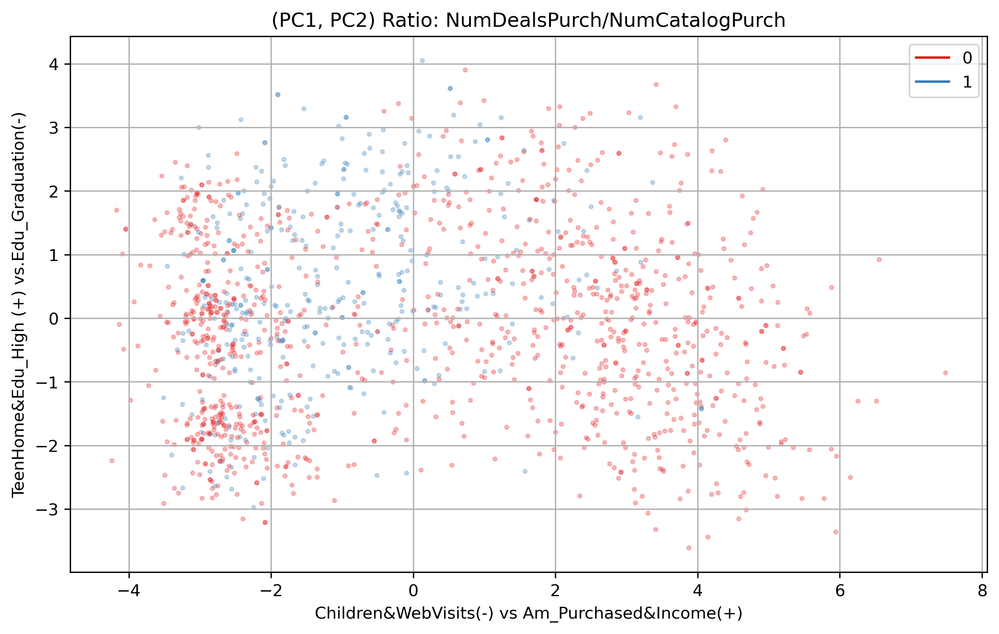

In [98]:
set1 = cm.Set1.colors
genpos = workdf_cp[ 'Deal_Purchase_Ratio_CatPurch'].unique()
genpos_colors = {genpos[i]:set1[i] for i in range(len(genpos))}
workdf_cp['color'] = [genpos_colors[t] for t in workdf_cp[ 'Deal_Purchase_Ratio_CatPurch'].values]
genpos_colors_legend = [Line2D([0], [0], color=genpos_colors[k]) for k in genpos_colors.keys()]

plt.figure(figsize=(10,6), dpi = 300)
plt.scatter(Y_std[:,0], Y_std[:,1], s=5, c=workdf_cp['color'].values, alpha =0.25)
plt.title('(PC1, PC2) Ratio: NumDealsPurch/NumCatalogPurch') 
plt.legend (genpos_colors_legend, [k for k in genpos_colors.keys()]) 
plt. xlabel (pc_names_std[0])
plt.ylabel(pc_names_std[1])
plt.grid()
plt.show()

### Observations: 

This second ratio, so the number of purchases done with deals with respect to the number of purchases via the catalog is more cluttered and noisy than the first ratio.

In [99]:
workdf_cp['Deal_Purchase_Ratio_StorePurch'] = np.where(
     workdf_cp['NumStorePurchases'] == 0, 
    1,
    workdf_cp['NumDealsPurchases'] /  workdf_cp['NumStorePurchases']
) 

In [100]:
workdf_cp['Deal_Purchase_Ratio_StorePurch'].unique()

array([0.16666667, 0.5       , 0.85714286, 0.1       , 0.09090909,
       1.        , 0.33333333, 0.07692308, 0.66666667, 0.4       ,
       0.25      , 1.33333333, 0.2       , 0.8       , 0.75      ,
       0.125     , 2.        , 0.83333333, 0.11111111, 0.14285714,
       1.4       , 0.15384615, 0.375     , 0.        , 0.08333333,
       1.2       , 1.16666667, 0.57142857, 0.27272727, 0.625     ,
       0.6       , 1.5       , 0.30769231, 1.1       , 2.2       ,
       1.75      , 0.18181818, 1.25      , 0.54545455, 0.3       ,
       0.28571429, 1.22222222, 0.23076923, 0.44444444, 0.41666667,
       0.9       , 0.71428571, 1.11111111, 0.22222222, 0.42857143,
       1.14285714, 0.45454545, 1.125     , 1.6       , 0.7       ,
       0.875     , 0.55555556, 1.66666667, 1.57142857, 0.58333333,
       0.36363636, 1.28571429, 0.77777778, 0.61538462, 0.46153846,
       1.44444444])

In [101]:
workdf_cp['Deal_Purchase_Ratio_StorePurch'].mean()

0.49960841268243655

In [102]:

workdf_cp['Deal_Purchase_Ratio_StorePurch'] = workdf_cp['Deal_Purchase_Ratio_StorePurch'].map(lambda x: 1 if x > 0.499 else 0)

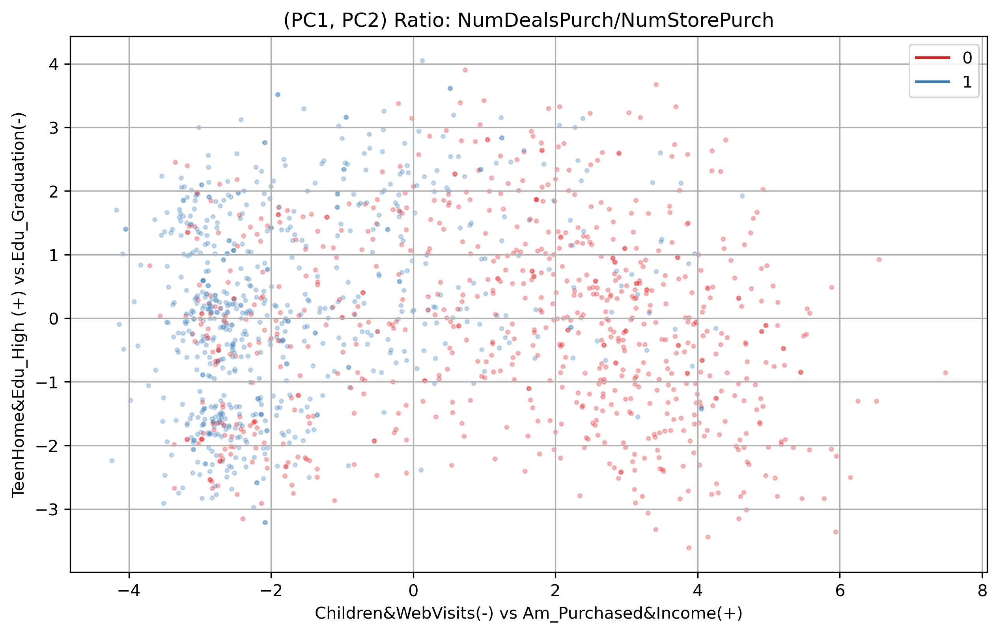

In [103]:
set1 = cm.Set1.colors
genpos = workdf_cp[ 'Deal_Purchase_Ratio_StorePurch'].unique()
genpos_colors = {genpos[i]:set1[i] for i in range(len(genpos))}
workdf_cp['color'] = [genpos_colors[t] for t in workdf_cp[ 'Deal_Purchase_Ratio_StorePurch'].values]
genpos_colors_legend = [Line2D([0], [0], color=genpos_colors[k]) for k in genpos_colors.keys()]

plt.figure(figsize=(10,6), dpi = 300)
plt.scatter(Y_std[:,0], Y_std[:,1], s=5, c=workdf_cp['color'].values, alpha =0.25)
plt.title('(PC1, PC2) Ratio: NumDealsPurch/NumStorePurch') 
plt.legend (genpos_colors_legend, [k for k in genpos_colors.keys()]) 
plt. xlabel (pc_names_std[0])
plt.ylabel(pc_names_std[1])
plt.grid()
plt.show()

### Observations:

The third and last ratio, appears to separate the data points in a more balanced way ( in comparison to the two other ratios). The points are in fact scattered everywhere for both classes but we can note that a higher concentration of blue points, so those in which the ratio between the Number of Purchases made with Deals and the Number of Purchases made in the store is bigger than the average (0.499) are those (mostly) with a value of PC1 < 1. People in this group have a ratio greater than the average, meaning they make a relatively higher proportion of their purchases using deals compared to in-store purchases, thus we can consider them deal-oriented Shoppers and price-sensitive. This comes as no surprise given that these people with regards to PC1 feature composition are those with a lower income and that lower values of overall purchases. Furthermore, these are people with a high number of children and web visits in the store. Perhaps they do a lot of web visits to select the deals, before determining which ones to purchase.  

## 4.3.3 Score graphs for Xworkdf_mm:

In [104]:
Y_mm = pca_mm.transform(Xworkdf_mm)

### A. Min-Max Scaled: Accepted Campaigns

In [105]:
seti = cm.Set1.colors
genpos = workdf_cp['Accepted_Campaigns']. unique()
genpos_colors = {genpos[i]:set1[i] for i in range(len(genpos))}
workdf_cp['color'] = [genpos_colors[t] for t in workdf_cp['Accepted_Campaigns'].values]
genpos_colors_legend = [Line2D([0], [0], color=genpos_colors[k]) for k in genpos_colors.keys()]
color = {1: 'green', 0: 'red'}
colors = ['green', 'red']
colors_legend = [Line2D([0], [0], color=color[k]) for k in color.keys()]

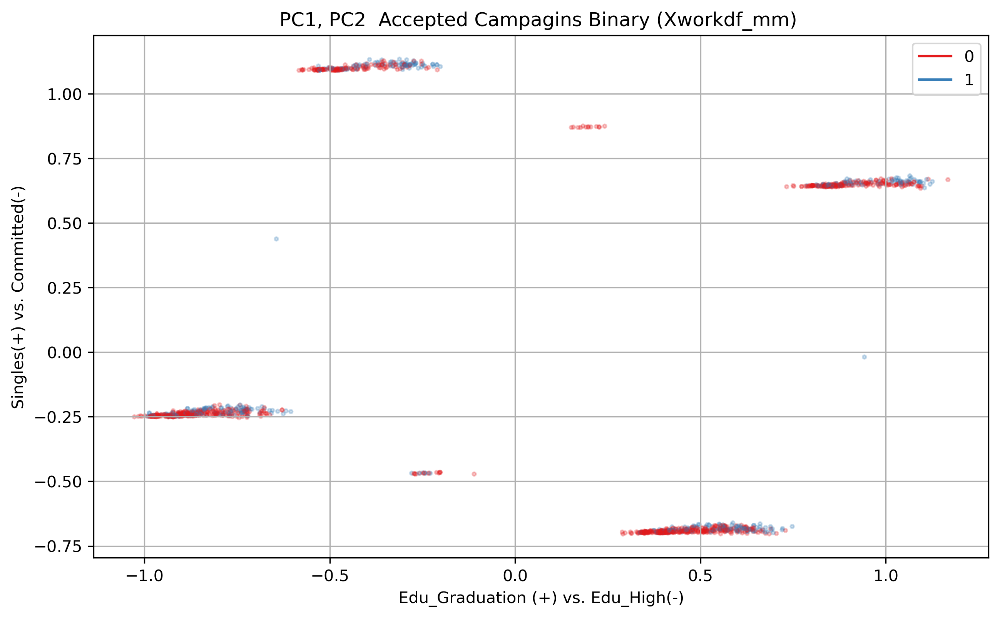

In [106]:
plt.figure(figsize=(10, 6), dpi = 300)
plt.scatter(Y_mm[:,0], Y_mm[:,1], s=5, c=workdf_cp['color'].values, alpha =0.25)
plt.title('PC1, PC2  Accepted Campagins Binary (Xworkdf_mm) ') 
plt.legend(genpos_colors_legend, [k for k in genpos_colors.keys()]) 
plt.xlabel(pc_names_mm[0])
plt.ylabel(pc_names_mm[1])
plt.grid(zorder=0)
plt.show()

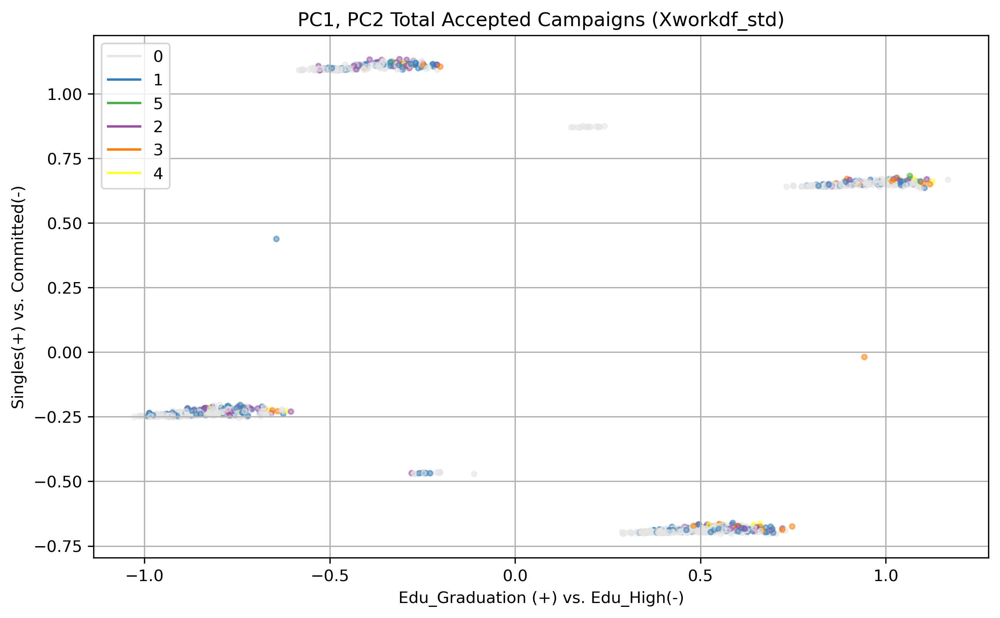

In [107]:
set1 = cm.Set1.colors
genpos = workdf_cp['Accepted_Campaigns2'].unique()

genpos_colors = {genpos[i]: set1[i] for i in range(len(genpos))}
genpos_colors[0] = '#E5E5E5'  # Set the color for 0 values

workdf_cp['color'] = [genpos_colors[t] for t in workdf_cp['Accepted_Campaigns2'].values]

genpos_colors_legend = [Line2D([0], [0], color=genpos_colors[k]) for k in genpos_colors.keys()]

# Plotting
plt.figure(figsize=(10, 6), dpi= 300)
plt.scatter(Y_mm[:,0], Y_mm[:,1], s=10, c=workdf_cp['color'].values, alpha=0.5)
plt.title('PC1, PC2 Total Accepted Campaigns (Xworkdf_std)')
plt.legend(genpos_colors_legend, [k for k in genpos_colors.keys()])
plt.xlabel(pc_names_mm[0])
plt.ylabel(pc_names_mm[1])
plt.grid(zorder=0)
plt.show()

### Observations: 

In both of the above configurations of the "accepted campaigns" label, we cannot distinguish a clear separation of the data.

### B. Min-max scaled: Recency

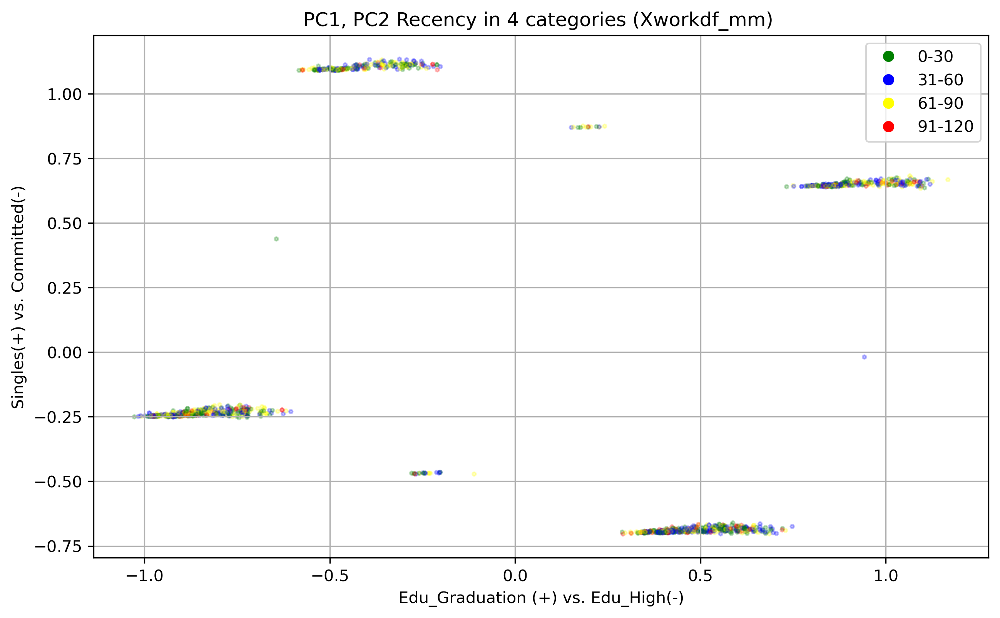

In [108]:
bins = [0, 30, 60, 90, 120]  #TODO WE CAN CHANGE THE BINS
labels = ['0-30', '31-60', '61-90', '91-120']
workdf_cp['RecencyRange'] = pd.cut(workdf_cp['Recency'], bins=bins, labels=labels, right=False)

range_colors = {
    '0-30': 'green',
    '31-60': 'blue',
    '61-90': 'yellow',
    '91-120': 'red'
}

workdf_cp['color'] = workdf_cp['RecencyRange'].map(range_colors)

# Create legend items for the ranges
legend_items = [Line2D([0], [0], color=color, marker='o', linestyle='', label=label) for label, color in range_colors.items()]


plt.figure(figsize=(10, 6), dpi=300)
plt.scatter(Y_mm[:,0], Y_mm[:,1], s=5, c=workdf_cp['color'].values, alpha =0.25)
plt.title('PC1, PC2 Recency in 4 categories (Xworkdf_mm) ') 
plt.legend (handles=legend_items) 
plt. xlabel (pc_names_mm[0])
plt.ylabel(pc_names_mm[1])
plt.grid(zorder=0)
plt.show()

### Observations:

No clear patterns can be identified in this case either.

### C. Min-Max Scaled: NumDeals & Ratios

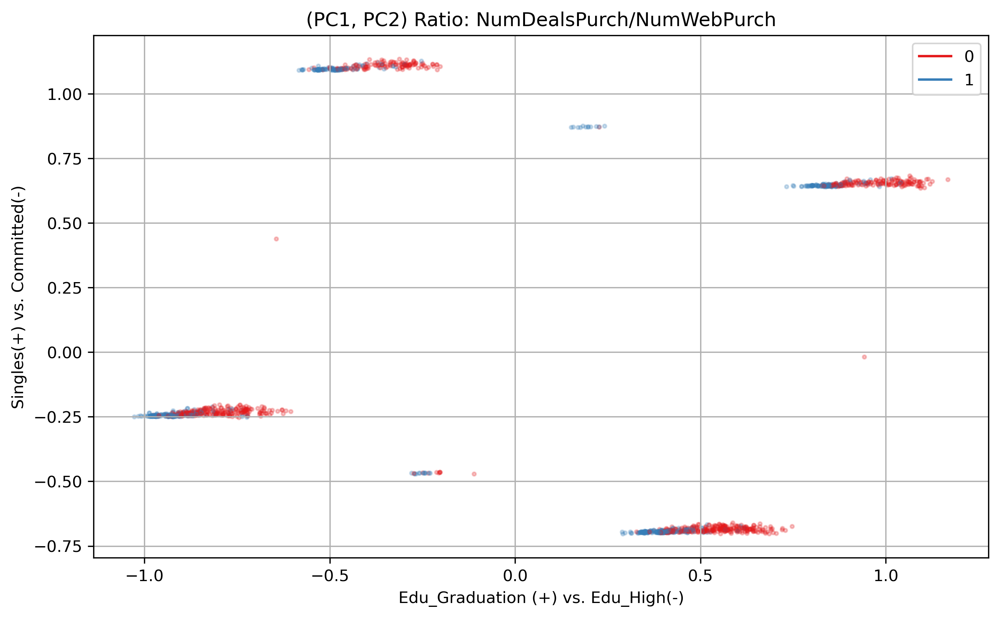

In [109]:
set1 = cm.Set1.colors
genpos = workdf_cp[ 'Deal_Purchase_Ratio_WebPurch'].unique()
genpos_colors = {genpos[i]:set1[i] for i in range(len(genpos))}
workdf_cp['color'] = [genpos_colors[t] for t in workdf_cp[ 'Deal_Purchase_Ratio_WebPurch'].values]
genpos_colors_legend = [Line2D([0], [0], color=genpos_colors[k]) for k in genpos_colors.keys()]
plt.figure(figsize=(10,6), dpi=300)
plt.scatter(Y_mm[:,0], Y_mm[:,1], s=5, c=workdf_cp['color'].values, alpha =0.25)
plt.title('(PC1, PC2) Ratio: NumDealsPurch/NumWebPurch') 
plt.legend (genpos_colors_legend, [k for k in genpos_colors.keys()]) 
plt. xlabel (pc_names_mm[0])
plt.ylabel(pc_names_mm[1])
plt.grid()
plt.show()

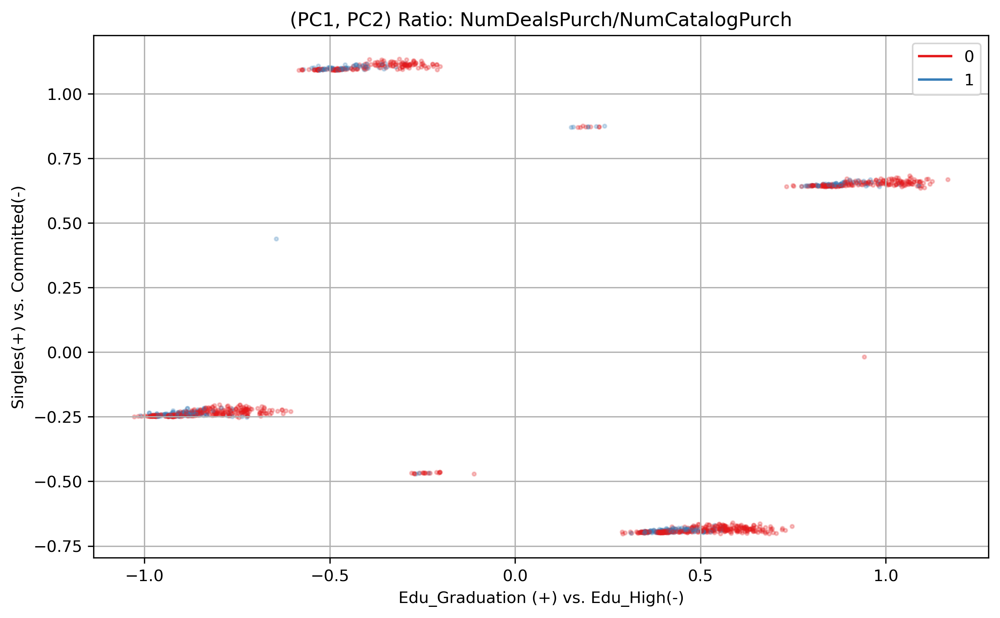

In [110]:
set1 = cm.Set1.colors
genpos = workdf_cp[ 'Deal_Purchase_Ratio_CatPurch'].unique()
genpos_colors = {genpos[i]:set1[i] for i in range(len(genpos))}
workdf_cp['color'] = [genpos_colors[t] for t in workdf_cp[ 'Deal_Purchase_Ratio_CatPurch'].values]
genpos_colors_legend = [Line2D([0], [0], color=genpos_colors[k]) for k in genpos_colors.keys()]
plt.figure(figsize=(10,6), dpi=300)
plt.scatter(Y_mm[:,0], Y_mm[:,1], s=5, c=workdf_cp['color'].values, alpha =0.25)
plt.title('(PC1, PC2) Ratio: NumDealsPurch/NumCatalogPurch') 
plt.legend (genpos_colors_legend, [k for k in genpos_colors.keys()]) 
plt. xlabel (pc_names_mm[0])
plt.ylabel(pc_names_mm[1])
plt.grid()
plt.show()

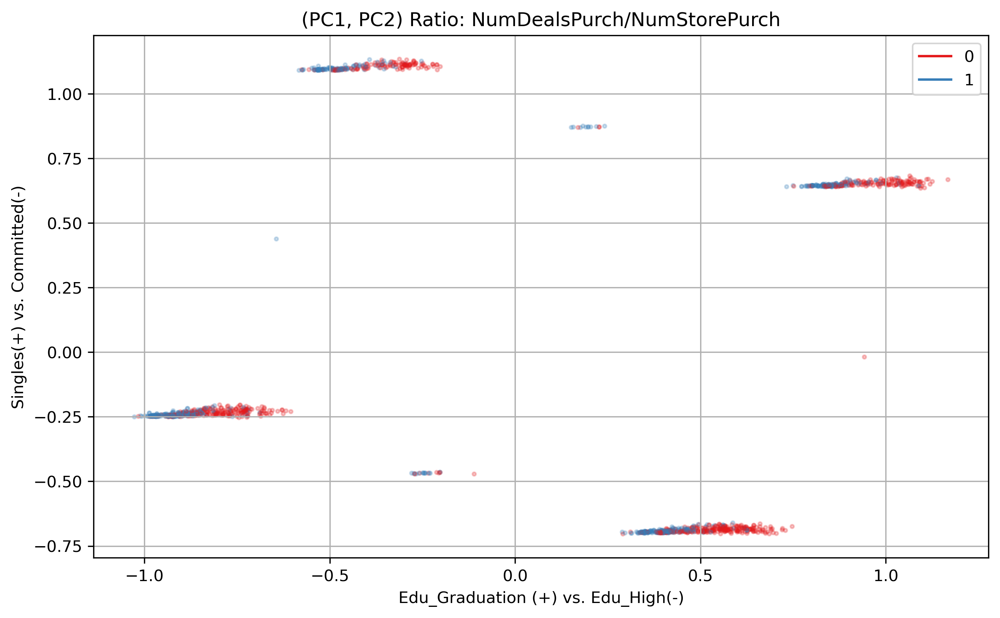

In [111]:
set1 = cm.Set1.colors
genpos = workdf_cp[ 'Deal_Purchase_Ratio_StorePurch'].unique()
genpos_colors = {genpos[i]:set1[i] for i in range(len(genpos))}
workdf_cp['color'] = [genpos_colors[t] for t in workdf_cp[ 'Deal_Purchase_Ratio_StorePurch'].values]
genpos_colors_legend = [Line2D([0], [0], color=genpos_colors[k]) for k in genpos_colors.keys()]
plt.figure(figsize=(10,6), dpi=300)
plt.scatter(Y_mm[:,0], Y_mm[:,1], s=5, c=workdf_cp['color'].values, alpha =0.25)
plt.title('(PC1, PC2) Ratio: NumDealsPurch/NumStorePurch') 
plt.legend (genpos_colors_legend, [k for k in genpos_colors.keys()]) 
plt. xlabel (pc_names_mm[0])
plt.ylabel(pc_names_mm[1])
plt.grid()
plt.show()

### Observations: 

In neither of the three graphs can we observe some clear divison of the data into groups. It appears, that for each of the four clusters, there is a mix of both categories 1 and 0, created using the ratios.

# <center> <span style="color:red">  5. k-means Clustering </span> </center>

## <center> 5.1 Standardized df </center> 

### 5.1.1 K-means and internal evaluation

In [112]:
# SET THE RANDOM STATE (THE LABORATORY DAY)
random_state = rs

# INITIALIZE SOME LISTS TO STORE THE TEMPORARY RESULTS AND, THEN, MAKE COMPARISONS
km_list = []
silcoeff_list = []
k_list = list(range(3, 11))

# START THE FOR-CYCLE TO RUN THE k-MEANS AND MEASURING THE SILHOUETTE COEFFICIENT
for i in range(len(k_list)):
    print(f'****************** START k-MEANS WITH k={k_list[i]} ******************')
    print('Computing...')
    km_list.append(KMeans(n_clusters=k_list[i], n_init=3, random_state=random_state))
    km = km_list[i]
    km.fit(Y_std)
    silcoeff_list.append(silhouette_score(Y_std, km.labels_))
    print(f'****************** END k-MEANS WITH k={k_list[i]} ******************')
    print('')

# FIND THE BEST VALUE OF k AND THE BEST KMeans OBJECT
i_best = np.argmax(silcoeff_list)
k = k_list[i_best]
km = km_list[i_best]

# VISUALIZE THE RESULT
print('')
print('')
print('****************** RESULTS OF THE SEARCH... ******************')
print(f'BEST SILHOUETTE SCORE: {np.max(silcoeff_list )} --> k = {k}')
print('**************************************************************')

****************** START k-MEANS WITH k=3 ******************
Computing...
****************** END k-MEANS WITH k=3 ******************

****************** START k-MEANS WITH k=4 ******************
Computing...
****************** END k-MEANS WITH k=4 ******************

****************** START k-MEANS WITH k=5 ******************
Computing...
****************** END k-MEANS WITH k=5 ******************

****************** START k-MEANS WITH k=6 ******************
Computing...
****************** END k-MEANS WITH k=6 ******************

****************** START k-MEANS WITH k=7 ******************
Computing...
****************** END k-MEANS WITH k=7 ******************

****************** START k-MEANS WITH k=8 ******************
Computing...
****************** END k-MEANS WITH k=8 ******************

****************** START k-MEANS WITH k=9 ******************
Computing...
****************** END k-MEANS WITH k=9 ******************

****************** START k-MEANS WITH k=10 ******************


In [113]:
Y_std

array([[ 2.82740131, -2.35112198],
       [-0.81841919,  0.05285198],
       [ 1.80567554,  1.08540426],
       ...,
       [-2.44513466, -1.50707203],
       [ 1.75393785, -1.61753305],
       [ 2.55781832, -1.68317393]])

In [114]:
km.cluster_centers_

array([[ 3.46486996, -0.59753794],
       [-2.37762247, -0.3700941 ],
       [ 0.69324801,  1.38019566]])

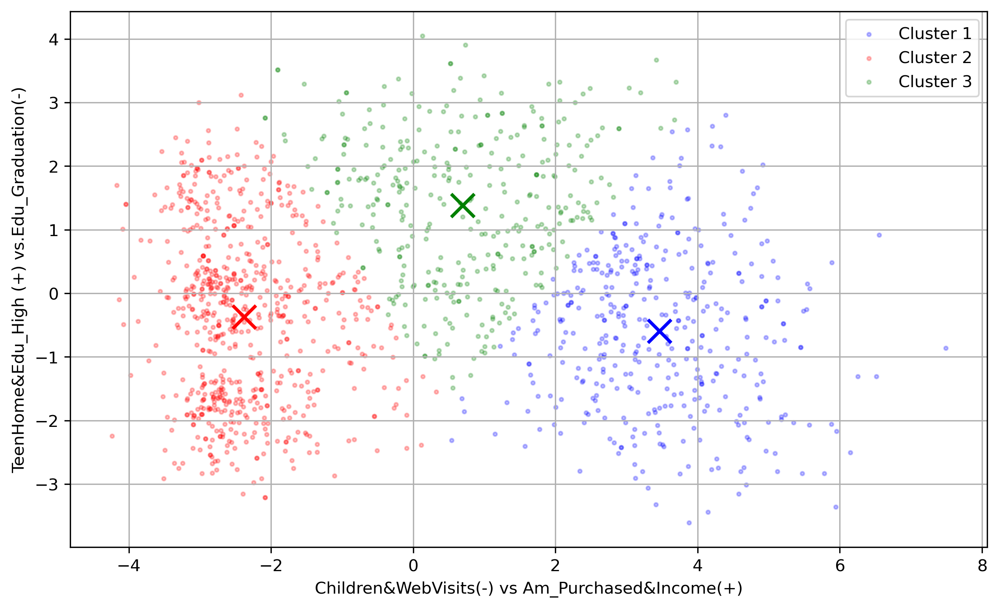

In [115]:
y_kmeans = km.predict(Y_std)
labels = {0: "Cluster 1", 1: "Cluster 2", 2: "Cluster 3"}
centers = km.cluster_centers_
colors = ['blue','red','green']
plt.figure(figsize=(10, 6), dpi = 300)

for i in range (3):
    color = colors [i]
    idx = y_kmeans == i
    plt.scatter (Y_std[idx,0], Y_std[idx, 1], color=color, s=5, label=labels[i], alpha=0.25)
    plt.scatter(centers[i, 0], centers[i, 1], linewidth=2, color=color, s=200, marker = "x", alpha=1)
plt. xlabel (pc_names_std[0])
plt.ylabel(pc_names_std[1])
plt.grid()
plt. legend()

### Observations: 

As it can be seen in the image above, K-means determines three clusters: cluster 2 (in red) and 1 (in blue) appear to differ more with respect to PC1 and the third cluster(in green) appears to have its centroid slightly higher with regards to PC2 than the other two clusters and lies between the first two with respect to PC1. 

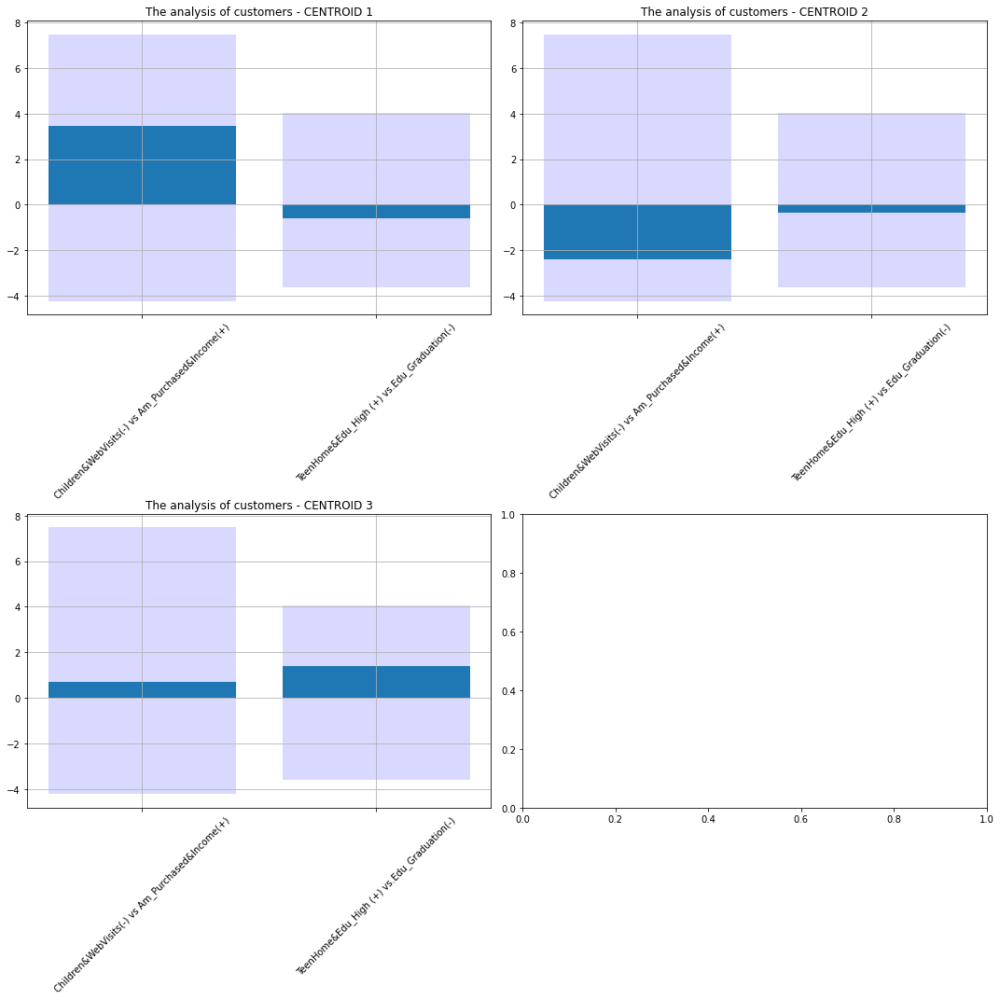

In [116]:
# COMPUTE THE MAX/MIN VALUES IN THE PC-SPACE
maxs_y = Y_std.max(axis=0)
mins_y = Y_std.min(axis=0)

# MAKE THE BARPLOTS OF THE CENTROIDS
fig_centroids, ax_centroids = plt.subplots(2, 2, figsize=(15, 15))
for ii in range(3):
    ir = ii // 2
    ic = ii % 2
    ax_centroids[ir, ic].bar(np.arange(km.cluster_centers_.shape[1]), maxs_y, color='blue', alpha=0.15)
    ax_centroids[ir, ic].bar(np.arange(km.cluster_centers_.shape[1]), mins_y, color='blue', alpha=0.15)
    ax_centroids[ir, ic].bar(np.arange(km.cluster_centers_.shape[1]), km.cluster_centers_[ii, :])
    ax_centroids[ir, ic].set_xticks(ticks=np.arange(km.cluster_centers_.shape[1]))
    ax_centroids[ir, ic].set_xticklabels(labels=pc_names_std, rotation=45)
    ax_centroids[ir, ic].grid(visible=True, which='both')
    plt.tight_layout()
    ax_centroids[ir, ic].set_title(f'The analysis of customers - CENTROID {ii+1}')

In [117]:
# Calculate the silhouette values for each sample
sample_silhouette_values = silhouette_samples(Y_std, km.labels_)

# Initialize an empty list to store mean silhouette scores for each cluster
means_lst = []

# Loop over each unique cluster label
for label in np.unique(km.labels_):
    # Calculate the mean silhouette score for the current cluster
    mean_silhouette = sample_silhouette_values[km.labels_ == label].mean()
    # Append the mean silhouette score to the list
    means_lst.append(mean_silhouette)

# Convert the list of mean silhouette scores to a DataFrame for better visualization
mean_silhouette_df = pd.DataFrame(means_lst, columns=['Mean Silhouette']).round(3)

# Display the DataFrame
print(mean_silhouette_df)

   Mean Silhouette
0            0.433
1            0.491
2            0.341


### Observations: 

1. <span style="color:blue"> Centroid 1 - cluster 1 </span>: as we can observe, the values of the centroid with respect to PC2 are very close to 0, so it appears to not make a large contribution in distinguishing our cluster, so they have a mix of people in terms of education. However, the value of PC1 is close to 3.5. Thus, these are customers with high purchasing and income and a low number of web visits and children. We can call them "childrenless high-income shoppers".

2. <span style="color:red"> Centroid 2 - cluster 2 </span> : As in the first cluster, here PC2 does not tell us much but PC1's coordinates are close to -2, thus customers with a low income & purchasing amount and a high number of kids at home and a high number of web visits. We can call them "parents with low income & spending".  

3. <span style ="color:green"> Centroid 3 - cluster 3 </span>: This last cluster is less identifiable by the first PC but rather more with respect to the second one. However, both of the values are close to 0:  0.69324801,  1.38019566, so it is hard to describe this group with respect of extremities. We can say that these are people with average (in comparison to the other clusters), income and spending and number of children. However, in comparison to the other two clusters, this group has a slightly elevated number of people whose education level is grouped as high and that the children that these people have are mainly teens. We can call them "mid-range income and highly educated shoppers"

From the values of the silhuette scores, we can understand that the second cluster is the most cohesive and well-separated from the other clusters, making it the most distinct. However, on average, the values are quite close to one another and we can say that if a silhouette value of 1 would be "the perfect clustering", this clustering of the data is slightly above average. 

### 5.1.2   Score graphs post clustering 

C:\Users\User\anaconda3\lib\site-packages\IPython\core\pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


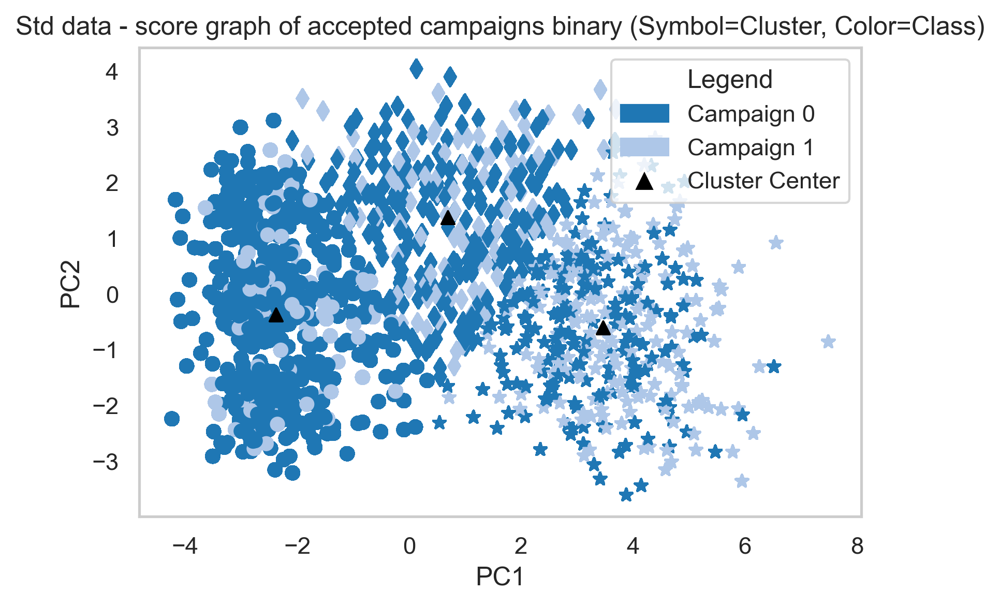

In [85]:
markers_dict = {0: '*', 1: 'o', 2: 'd'}
colors = cm.tab20.colors

# Create custom legend handles for the colors
unique_campaigns = sorted(workdf_cp['Accepted_Campaigns'].unique())
color_handles = [mpatches.Patch(color=colors[ii], label=f'Campaign {uc}') for ii, uc in enumerate(unique_campaigns)]


plt.figure(dpi=300)
for ll in km.labels_:
    plt.scatter(Y_std[km.labels_ == ll, 0], Y_std[km.labels_ == ll, 1], c=[colors[ii] for ii in workdf_cp['Accepted_Campaigns'].values[km.labels_ == ll]], marker=markers_dict[ll])
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], c='black', marker='^')
plt.title('Std data - score graph of accepted campaigns binary (Symbol=Cluster, Color=Class)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid()
# Add the legend for the colors and cluster centers
plt.legend(handles=color_handles + [plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='black', markersize=10, label='Cluster Center')], title='Legend')

plt.show()

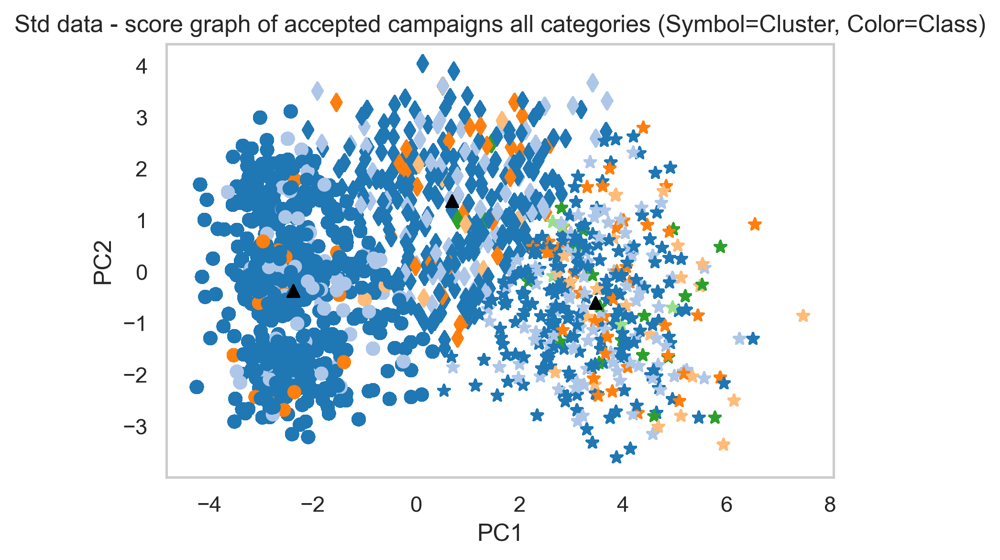

In [86]:
markers_dict = {0: '*', 1: 'o', 2: 'd'}
colors = cm.tab20.colors

plt.figure(dpi=300)
for ll in km.labels_:
    plt.scatter(Y_std[km.labels_ == ll, 0], Y_std[km.labels_ == ll, 1], c=[colors[ii] for ii in workdf_cp['Accepted_Campaigns2'].values[km.labels_ == ll]], marker=markers_dict[ll])
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], c='black', marker='^')
plt.title('Std data - score graph of accepted campaigns all categories (Symbol=Cluster, Color=Class)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid()
plt.show()

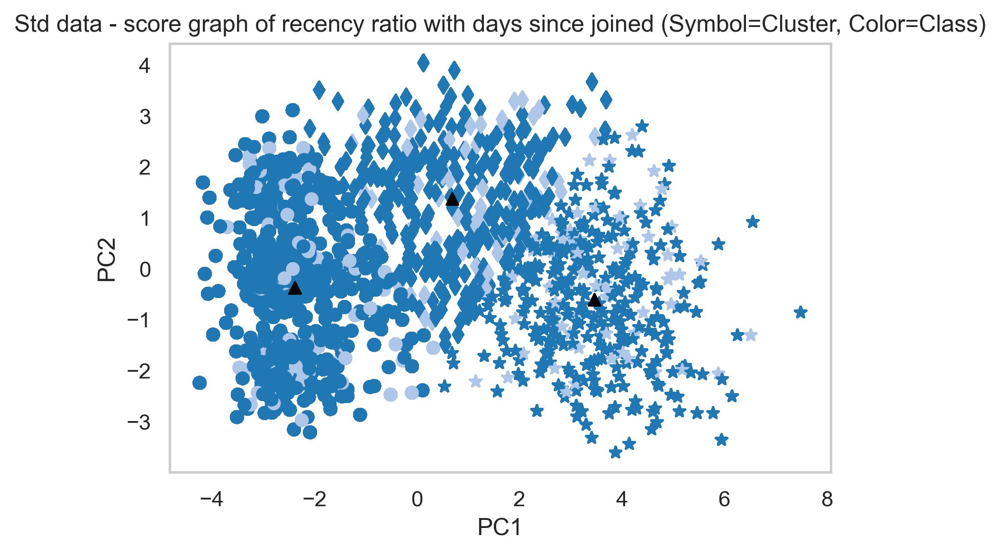

In [87]:
plt.figure(dpi=300)
for ll in km.labels_:
    plt.scatter(Y_std[km.labels_ == ll, 0], Y_std[km.labels_ == ll, 1], c=[colors[ii] for ii in workdf_cp['Recency_Ratio_DaysSinceJoined'].values[km.labels_ == ll]], marker=markers_dict[ll])
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], c='black', marker='^')
plt.title('Std data - score graph of recency ratio with days since joined (Symbol=Cluster, Color=Class)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid()
plt.show()

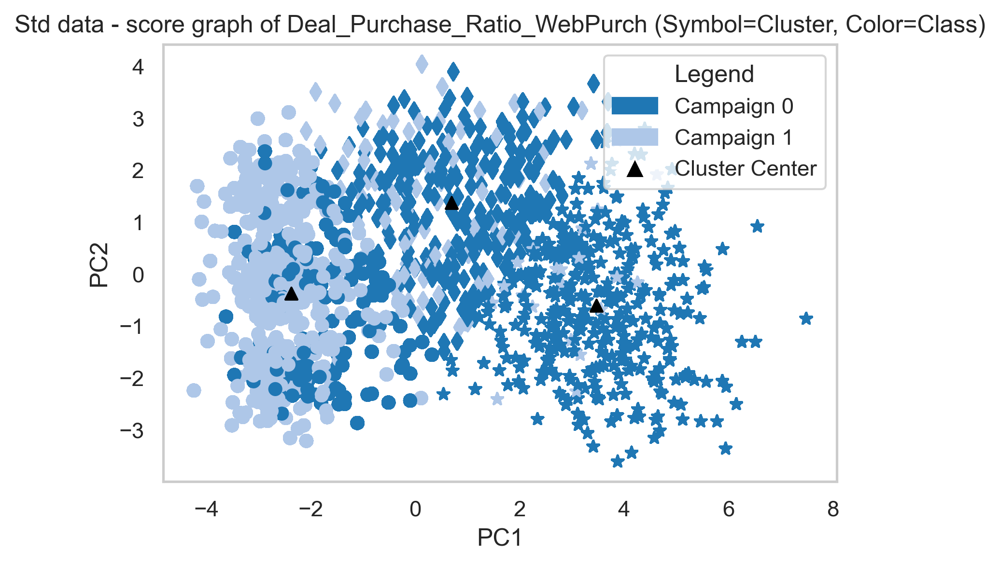

In [88]:
plt.figure(dpi=300)
for ll in km.labels_:
    plt.scatter(Y_std[km.labels_ == ll, 0], Y_std[km.labels_ == ll, 1], c=[colors[ii] for ii in workdf_cp['Deal_Purchase_Ratio_WebPurch'].values[km.labels_ == ll]], marker=markers_dict[ll])
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], c='black', marker='^')
plt.title('Std data - score graph of Deal_Purchase_Ratio_WebPurch (Symbol=Cluster, Color=Class)')
plt.xlabel('PC1')
plt.ylabel('PC2')
# Add the legend for the colors and cluster centers
plt.legend(handles=color_handles + [plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='black', markersize=10, label='Cluster Center')], title='Legend')
plt.grid()
plt.show()

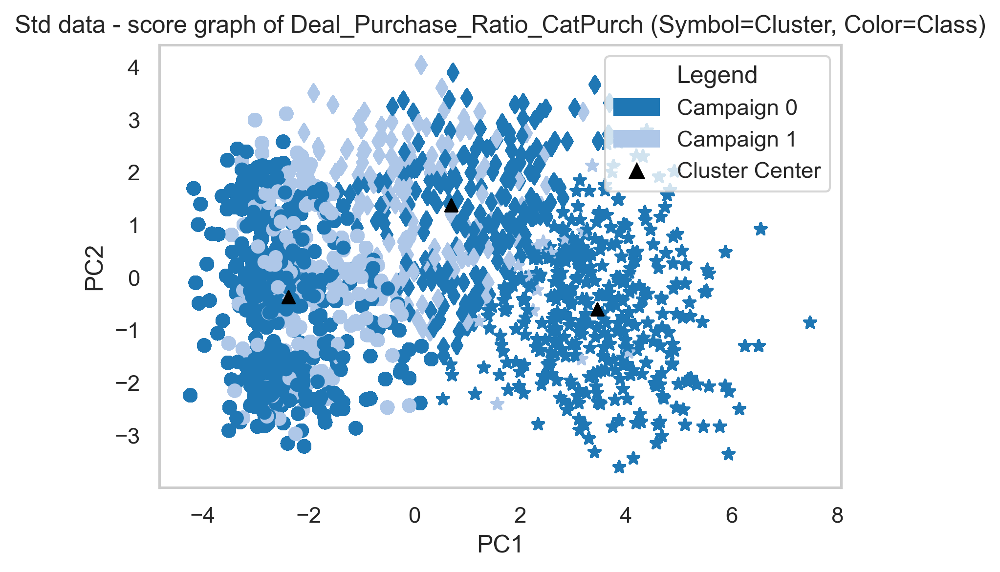

In [89]:
plt.figure(dpi=300)
for ll in km.labels_:
    plt.scatter(Y_std[km.labels_ == ll, 0], Y_std[km.labels_ == ll, 1], c=[colors[ii] for ii in workdf_cp['Deal_Purchase_Ratio_CatPurch'].values[km.labels_ == ll]], marker=markers_dict[ll])
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], c='black', marker='^')
plt.title('Std data - score graph of Deal_Purchase_Ratio_CatPurch (Symbol=Cluster, Color=Class)')
plt.xlabel('PC1')
plt.ylabel('PC2')
# Add the legend for the colors and cluster centers
plt.legend(handles=color_handles + [plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='black', markersize=10, label='Cluster Center')], title='Legend')
plt.grid()
plt.show()

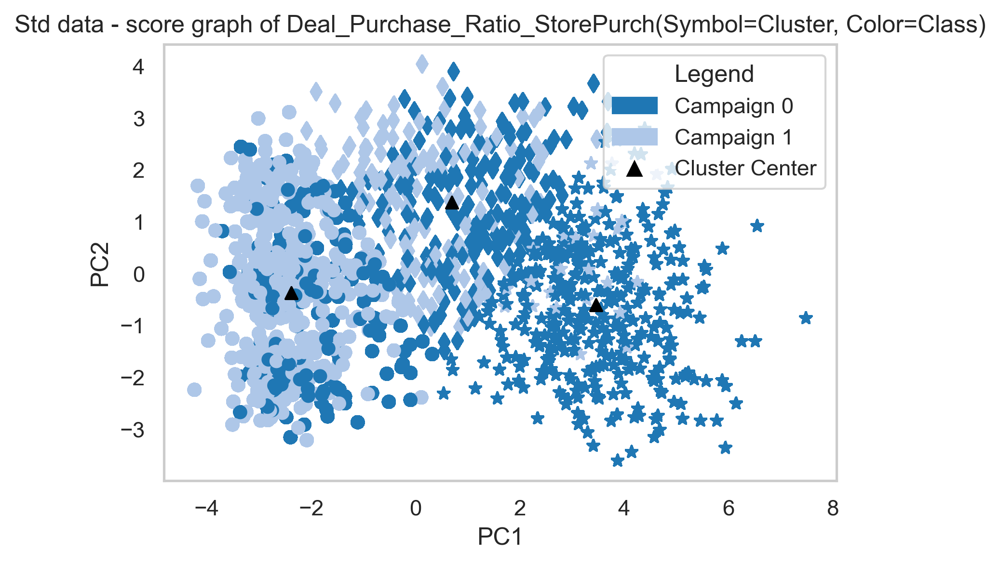

In [90]:
plt.figure(dpi=300)
for ll in km.labels_:
    plt.scatter(Y_std[km.labels_ == ll, 0], Y_std[km.labels_ == ll, 1], c=[colors[ii] for ii in workdf_cp['Deal_Purchase_Ratio_StorePurch'].values[km.labels_ == ll]], marker=markers_dict[ll])
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], c='black', marker='^')
plt.title('Std data - score graph of Deal_Purchase_Ratio_StorePurch(Symbol=Cluster, Color=Class)')
plt.xlabel('PC1')
plt.ylabel('PC2')
# Add the legend for the colors and cluster centers
plt.legend(handles=color_handles + [plt.Line2D([0], [0], marker='^', color='w', markerfacecolor='black', markersize=10, label='Cluster Center')], title='Legend')
plt.grid()
plt.show()

### Observations: 

We can observe in the graphs above that when we try to understand the clusters with respect to the labels, the divisions in this case are not that "clear-cut". All the different labels seem to be spread in all clusters. There exists only a slight difference with respect to the ratios made using Num Deal Purchases. However, this could be the case that we are using features to build these ratios.

### 5.1.3 External Evaluation

#### A. Recency Frequecy count

In [118]:
cluster_names = [ "childrenless high income & spending shoppers", 
                 "parents with low income & spending",
                 "mid-range income and highly educated shoppers"]

In [119]:
km.labels_

array([0, 1, 2, ..., 1, 0, 0])

In [120]:
k

3

In [121]:
mask_clusters = [km.labels_ == ii for ii in range(k)]
cluster_genpos = [dict(workdf_cp.loc[mask_clusters[ii], 'RecencyRange'].value_counts()) for ii in range(k)]


In [122]:
bin_labels = ['0-30',
    '31-60',
    '61-90',
    '91-120']

In [123]:
maxcount = max([max(cluster_genpos[kk].values()) for kk in range(len(cluster_genpos))])
print("Max count:", maxcount)

Max count: 224


In [124]:
print(cluster_genpos)

[{'0-30': 127, '61-90': 118, '31-60': 115, '91-120': 44}, {'31-60': 224, '61-90': 205, '0-30': 202, '91-120': 63}, {'0-30': 116, '61-90': 109, '31-60': 104, '91-120': 32}]


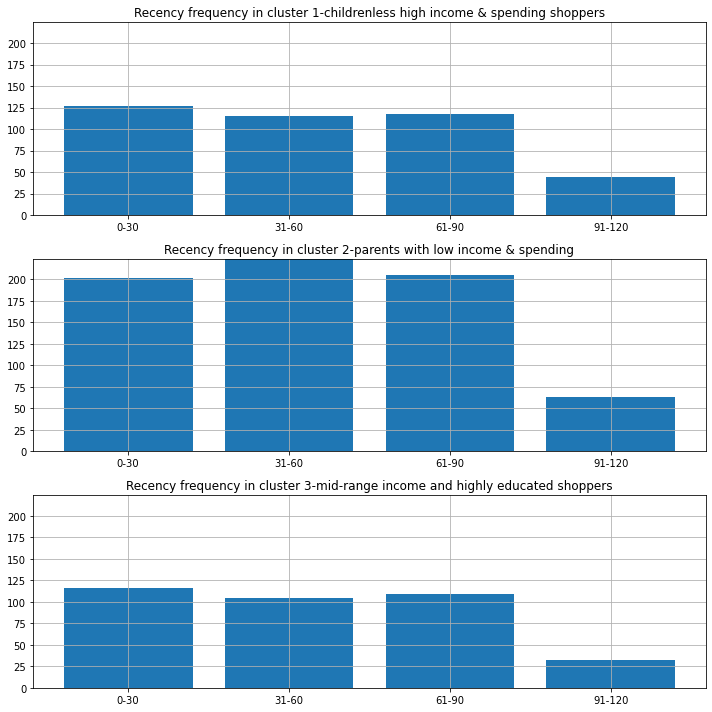

In [125]:
# Create a 3x1 grid of subplots (3 rows, 1 column)
fig_centroids, ax_centroids = plt.subplots(3, 1, figsize=(10, 10))

# Plot the data for each cluster
for ii in range(len(cluster_genpos)):  # k is 3
    bar_heights = [cluster_genpos[ii].get(bb, 0) for bb in bin_labels]
    
    ax_centroids[ii].bar(bin_labels, bar_heights)
    
    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount])
    
    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Recency frequency in cluster {ii+1}-{cluster_names[ii]}')

plt.tight_layout()
plt.show()

In [126]:
cluster_genpos0 = [dict(workdf_cp.loc[mask_clusters[ii], 'Recency_Ratio_DaysSinceJoined'].value_counts()) for ii in range(k)]
cluster_genpos0

[{0: 331, 1: 73}, {0: 609, 1: 85}, {0: 299, 1: 62}]

In [127]:
bin_labels0 = [0, 1]

In [128]:
maxcount0 = max([max(cluster_genpos0[kk].values()) for kk in range(len(cluster_genpos0))])
print("Max count:", maxcount0)

Max count: 609


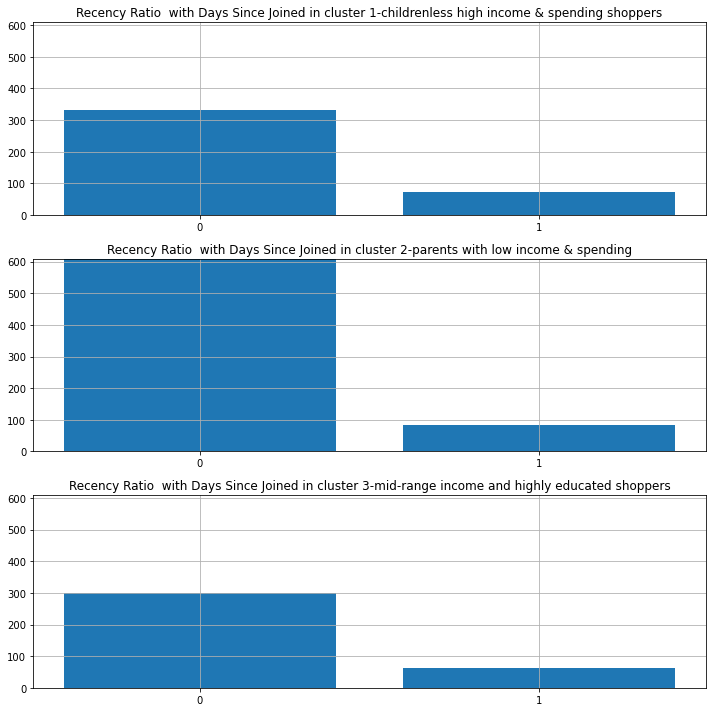

In [129]:
# Create a 3x1 grid of subplots (3 rows, 1 column)
fig_centroids, ax_centroids = plt.subplots(3, 1, figsize=(10, 10))

# Plot the data for each cluster
for ii in range(len(cluster_genpos0)):  # k is 3
    bar_heights = [cluster_genpos0[ii].get(bb, 0) for bb in bin_labels0]
    
    ax_centroids[ii].bar(bin_labels0, bar_heights)
    
    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount0])
    
    
    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels0)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels0)  # Ensure labels match the tick positions
    
    
    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Recency Ratio  with Days Since Joined in cluster {ii+1}-{cluster_names[ii]}')

plt.tight_layout()
plt.show()

#### B. Accepted_Campaigns - both versions frequency counts

In [130]:
cluster_genpos1 = [dict(workdf_cp.loc[mask_clusters[ii], 'Accepted_Campaigns'].value_counts()) for ii in range(k)]
cluster_genpos1

[{0: 218, 1: 186}, {0: 579, 1: 115}, {0: 256, 1: 105}]

In [131]:
bin_labels1 = [ 0, 1]

In [132]:
maxcount1 = max([max(cluster_genpos1[kk].values()) for kk in range(len(cluster_genpos1))])
print("Max count:", maxcount1)

Max count: 579


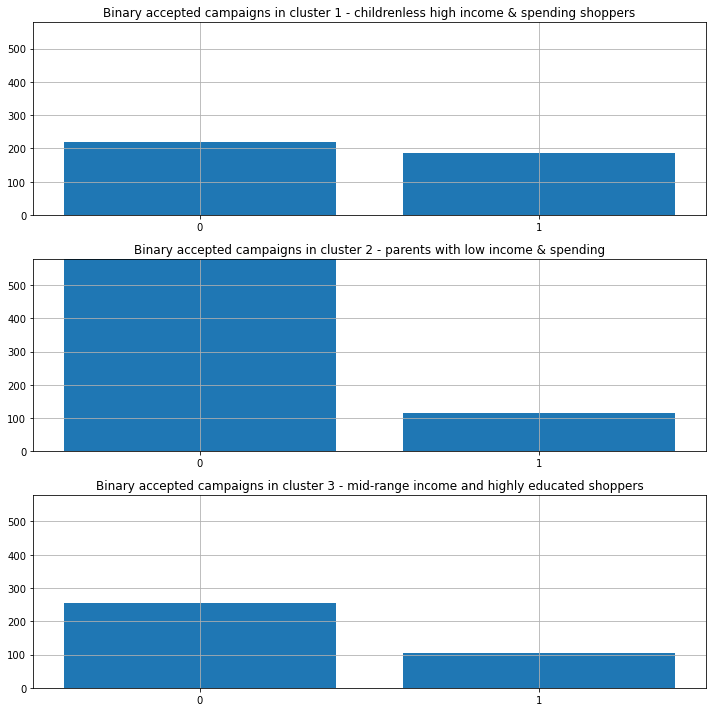

In [133]:
# Create a 3x1 grid of subplots (3 rows, 1 column)
fig_centroids, ax_centroids = plt.subplots(3, 1, figsize=(10, 10))

for ii in range(len(cluster_genpos1)):  # k is 3
    bar_heights = [cluster_genpos1[ii].get(bb, 0) for bb in bin_labels1]

    ax_centroids[ii].bar(bin_labels1, bar_heights)

    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount1])

    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels1)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels1)  # Ensure labels match the tick positions

    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Binary accepted campaigns in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

In [134]:
cluster_genpos2 = [dict(workdf_cp.loc[mask_clusters[ii], 'Accepted_Campaigns2'].value_counts()) for ii in range(k)]
cluster_genpos2

[{0: 218, 1: 95, 2: 40, 3: 26, 4: 20, 5: 5},
 {0: 579, 1: 94, 2: 19, 3: 2},
 {0: 256, 1: 66, 2: 29, 3: 7, 4: 3}]

In [135]:
bin_labels2 = [ 0, 1, 3, 4, 5]

In [136]:
maxcount2 = max([max(cluster_genpos2[kk].values()) for kk in range(len(cluster_genpos2))])
print("Max count:", maxcount2)

Max count: 579


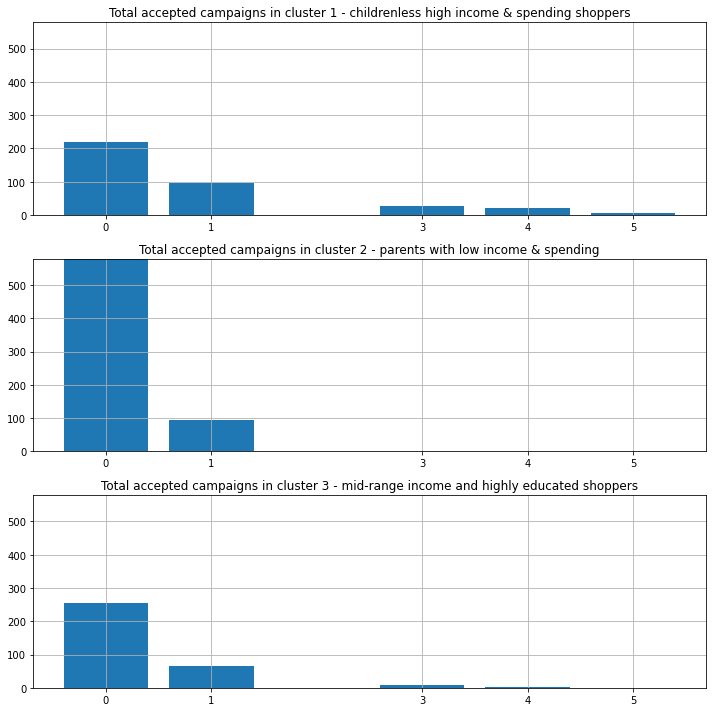

In [137]:
# Create a 3x1 grid of subplots (3 rows, 1 column)
fig_centroids, ax_centroids = plt.subplots(3, 1, figsize=(10, 10))

for ii in range(len(cluster_genpos2)):  # k is 3
    bar_heights = [cluster_genpos2[ii].get(bb, 0) for bb in bin_labels2]

    ax_centroids[ii].bar(bin_labels2, bar_heights)

    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount2])

    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels2)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels2)  # Ensure labels match the tick positions

    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Total accepted campaigns in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

#### C. NumDeals Ratios

In [138]:
cluster_genpos7 = [dict(workdf_cp.loc[mask_clusters[ii], 'Deal_Purchase_Ratio_StorePurch'].value_counts()) for ii in range(k)]
cluster_genpos7

[{0: 375, 1: 29}, {1: 498, 0: 196}, {0: 208, 1: 153}]

In [139]:
bin_labels7 = [ 0, 1]

In [140]:
maxcount7 = max([max(cluster_genpos7[kk].values()) for kk in range(len(cluster_genpos7))])
print("Max count:", maxcount7)

Max count: 498


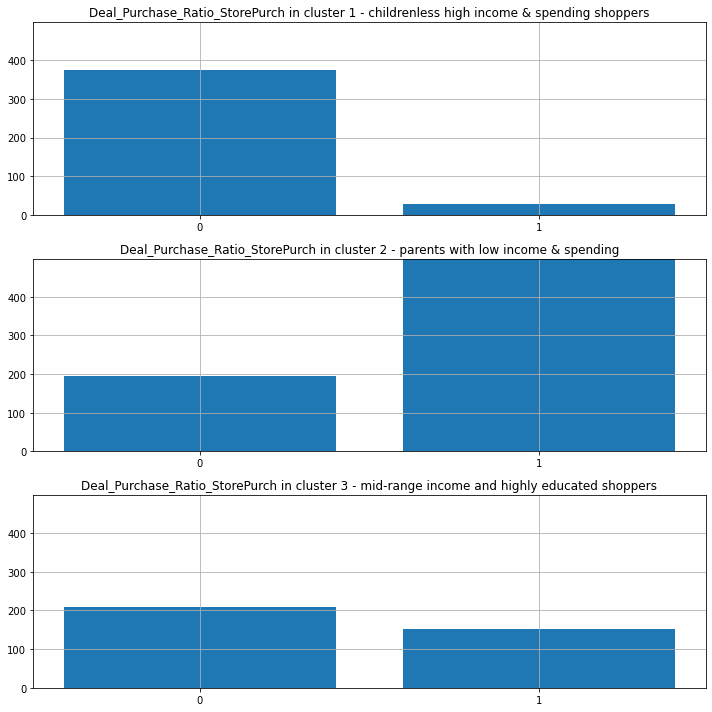

In [141]:
# Create a 3x1 grid of subplots (3 rows, 1 column)
fig_centroids, ax_centroids = plt.subplots(3, 1, figsize=(10, 10))

for ii in range(len(cluster_genpos7)):  # k is 3
    bar_heights = [cluster_genpos7[ii].get(bb, 0) for bb in bin_labels7]

    ax_centroids[ii].bar(bin_labels7, bar_heights)

    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount7])

    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels7)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels7)  # Ensure labels match the tick positions

    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Deal_Purchase_Ratio_StorePurch in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

In [142]:
cluster_genpos8 = [dict(workdf_cp.loc[mask_clusters[ii], 'Deal_Purchase_Ratio_WebPurch'].value_counts()) for ii in range(k)]
cluster_genpos8

[{0: 382, 1: 22}, {1: 518, 0: 176}, {0: 270, 1: 91}]

In [143]:
maxcount8 = max([max(cluster_genpos8[kk].values()) for kk in range(len(cluster_genpos8))])
print("Max count:", maxcount8)

Max count: 518


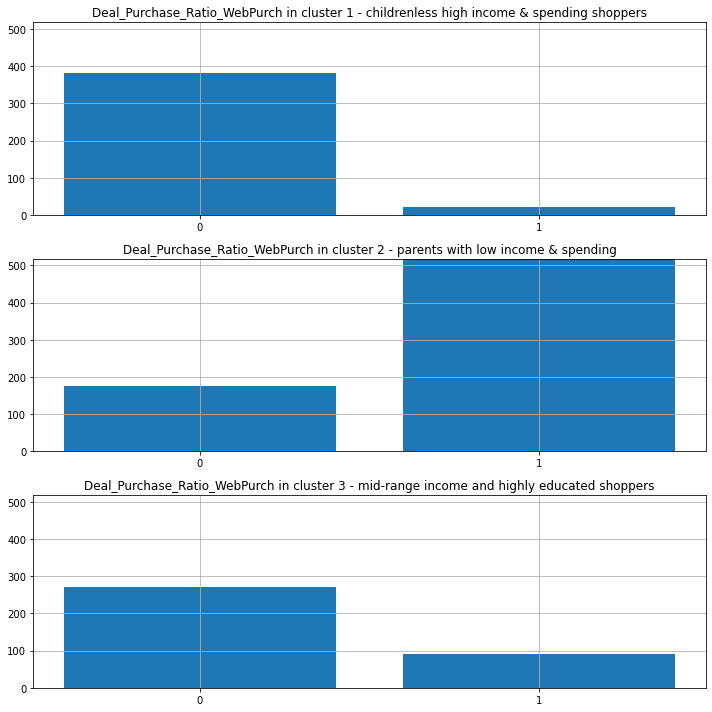

In [144]:
# Create a 3x1 grid of subplots (3 rows, 1 column)
fig_centroids, ax_centroids = plt.subplots(3, 1, figsize=(10, 10))

for ii in range(len(cluster_genpos8)):  # k is 3
    bar_heights = [cluster_genpos8[ii].get(bb, 0) for bb in bin_labels7]

    ax_centroids[ii].bar(bin_labels7, bar_heights)

    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount8])

    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels7)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels7)  # Ensure labels match the tick positions

    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Deal_Purchase_Ratio_WebPurch in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

In [145]:
cluster_genpos9 = [dict(workdf_cp.loc[mask_clusters[ii], 'Deal_Purchase_Ratio_CatPurch'].value_counts()) for ii in range(k)]
cluster_genpos9

[{0: 389, 1: 15}, {0: 475, 1: 219}, {0: 217, 1: 144}]

In [146]:
maxcount9 = max([max(cluster_genpos9[kk].values()) for kk in range(len(cluster_genpos9))])
print("Max count:", maxcount9)

Max count: 475


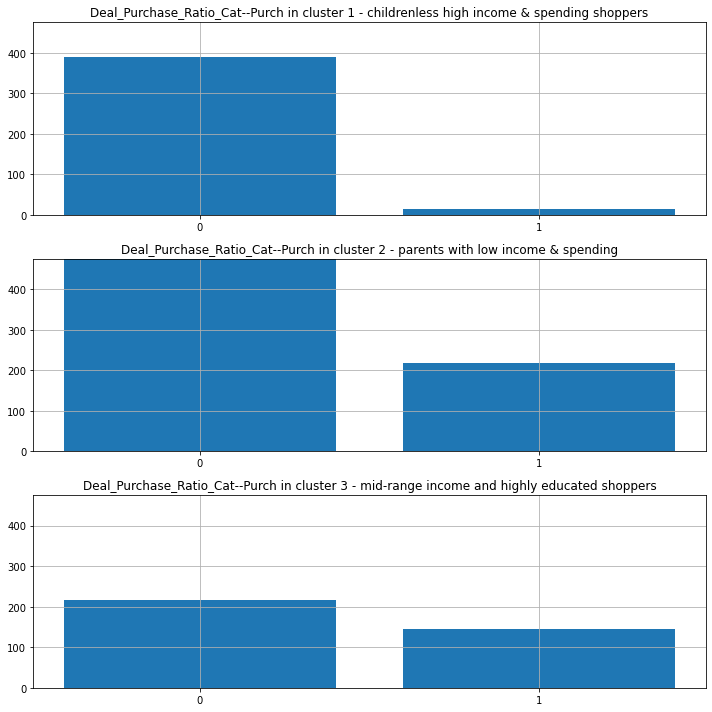

In [147]:
# Create a 3x1 grid of subplots (3 rows, 1 column)
fig_centroids, ax_centroids = plt.subplots(3, 1, figsize=(10, 10))

for ii in range(len(cluster_genpos9)):  # k is 3
    bar_heights = [cluster_genpos9[ii].get(bb, 0) for bb in bin_labels7]

    ax_centroids[ii].bar(bin_labels7, bar_heights)

    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount9])

    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels7)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels7)  # Ensure labels match the tick positions

    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Deal_Purchase_Ratio_Cat--Purch in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

### Observations: 

<ul>
  <li> Recency & recency ratio: nothing can really be observed here in terms of clusters separating the data in a meaningful way.</li>
  <li>Accepted Campaigns: for the binary case, the best chance the shop managers have to get people to accept campaigns are by perhaps targeting "childrenless high income and spending shoppers" and even this is like a 50/50 chance. For the rest, it seems that the wide majority will not accept the offers (most likely), particulary "parents with low income and spending". For the case in which we have all 6 values of "accepted_campaign", it is again the same group of "childrenless high income and spending shoppers" which have the best chance of accepting not just 1 but also more than 1 campaign.  </li>
  <li> Num of Deals Purchases and respective ratios:for the first two ratios deal_purchases/store_purchases and deal_purchases/web_purchases, when these values are encoded as 1, meaning that the ratio is higher than average, it is in both cases "parents with low income and spending" that have a substational higher count of "1". Whereas for the third ratio num_deals/ num_catalog_purchases, in all three clusters of customers the highest count is on 0. Particulary, the group of "childrenless high income and spending shoppers". Thus, perhaps when the store managers construct marketing campaigns for deals, they shouldn't target these people.</li>
</ul>

## <center> 5.2 MinMax df  </center>

### 5.2.1 K-means and internal evaluation

In [148]:
# SET THE RANDOM STATE (THE LABORATORY DAY)
random_state = rs

# INITIALIZE SOME LISTS TO STORE THE TEMPORARY RESULTS AND, THEN, MAKE COMPARISONS
km_list = []
silcoeff_list = []
k_list = list(range(3, 11))

# START THE FOR-CYCLE TO RUN THE k-MEANS AND MEASURING THE SILHOUETTE COEFFICIENT
for i in range(len(k_list)):
    print(f'****************** START k-MEANS WITH k={k_list[i]} ******************')
    print('Computing...')
    km_list.append(KMeans(n_clusters=k_list[i], n_init=3, random_state=random_state))
    km = km_list[i]
    km.fit(Y_mm)
    silcoeff_list.append(silhouette_score(Y_mm, km.labels_))
    print(f'****************** END k-MEANS WITH k={k_list[i]} ******************')
    print('')

# FIND THE BEST VALUE OF k AND THE BEST KMeans OBJECT
i_best = np.argmax(silcoeff_list)
k = k_list[i_best]
km = km_list[i_best]

# VISUALIZE THE RESULT
print('')
print('')
print('****************** RESULTS OF THE SEARCH... ******************')
print(f'BEST SILHOUETTE SCORE: {np.max(silcoeff_list )} --> k = {k}')
print('**************************************************************')

****************** START k-MEANS WITH k=3 ******************
Computing...
****************** END k-MEANS WITH k=3 ******************

****************** START k-MEANS WITH k=4 ******************
Computing...
****************** END k-MEANS WITH k=4 ******************

****************** START k-MEANS WITH k=5 ******************
Computing...
****************** END k-MEANS WITH k=5 ******************

****************** START k-MEANS WITH k=6 ******************
Computing...
****************** END k-MEANS WITH k=6 ******************

****************** START k-MEANS WITH k=7 ******************
Computing...
****************** END k-MEANS WITH k=7 ******************

****************** START k-MEANS WITH k=8 ******************
Computing...
****************** END k-MEANS WITH k=8 ******************

****************** START k-MEANS WITH k=9 ******************
Computing...
****************** END k-MEANS WITH k=9 ******************

****************** START k-MEANS WITH k=10 ******************


In [149]:
Y_mm

array([[ 0.60174699, -0.68997237],
       [ 0.44209764, -0.68736463],
       [-0.32710858,  1.12039618],
       ...,
       [ 0.40488319, -0.6962146 ],
       [ 0.95912987,  0.65038089],
       [ 0.56362347, -0.6889543 ]])

In [150]:
km.cluster_centers_

array([[-0.83361749, -0.24772592],
       [ 0.92540085,  0.64794682],
       [ 0.47806499, -0.68954634],
       [-0.3777662 ,  1.08785805]])

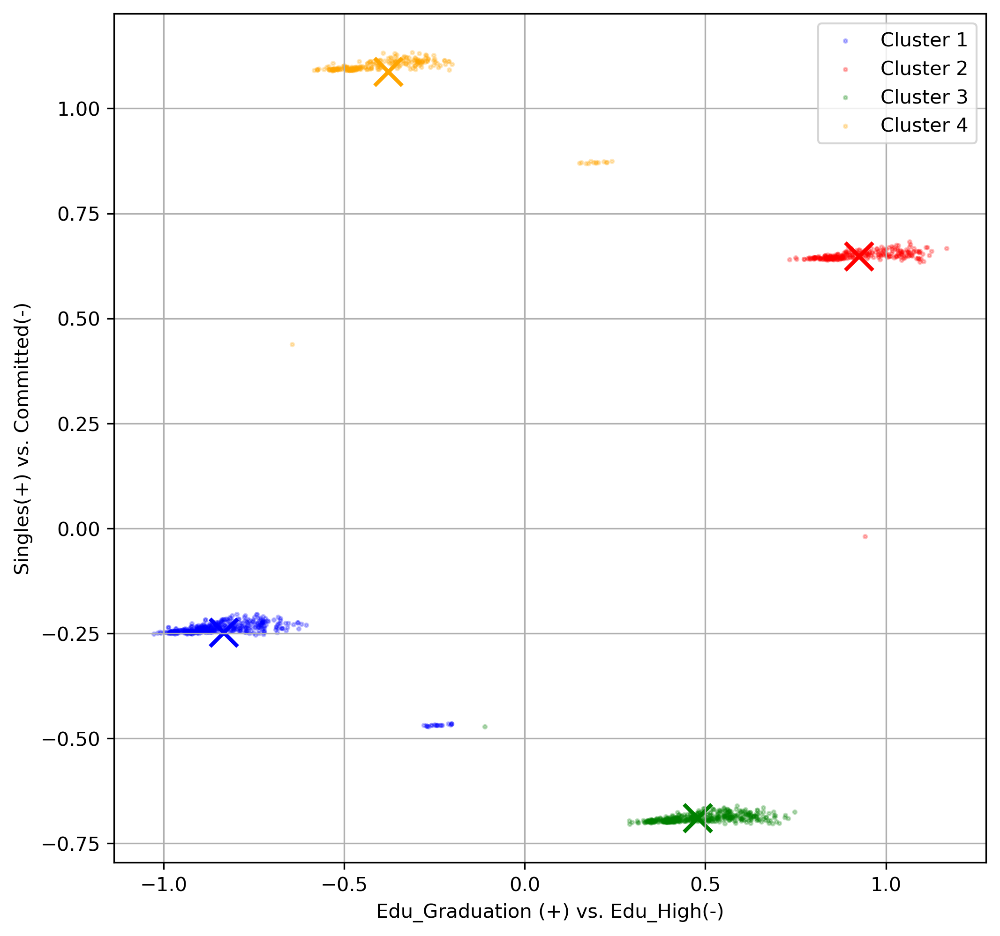

In [151]:
# Now we want to visualize the clusters
y_kmeans = km.predict(Y_mm)
labels = {0: "Cluster 1", 1: "Cluster 2", 2: "Cluster 3", 3: "Cluster 4"}
centers = km.cluster_centers_
colors = ['blue','red','green', 'orange']
plt.figure(figsize = (8,8), dpi = 300)

for i in range (4):
    # plot one cluster for each color
    color = colors [i]
    # find indeces corresponding to cluster i
    idx = y_kmeans == i
    plt.scatter (Y_mm[idx,0], Y_mm[idx, 1], color=color, s=3, label=labels[i], alpha=0.25)
    plt.scatter(centers[i, 0], centers[i, 1], linewidth=2, color=color, s=200, marker = "x", alpha=1)
plt. xlabel (pc_names_mm[0])
plt.ylabel(pc_names_mm[1])
plt.grid(zorder=0)
plt. legend()


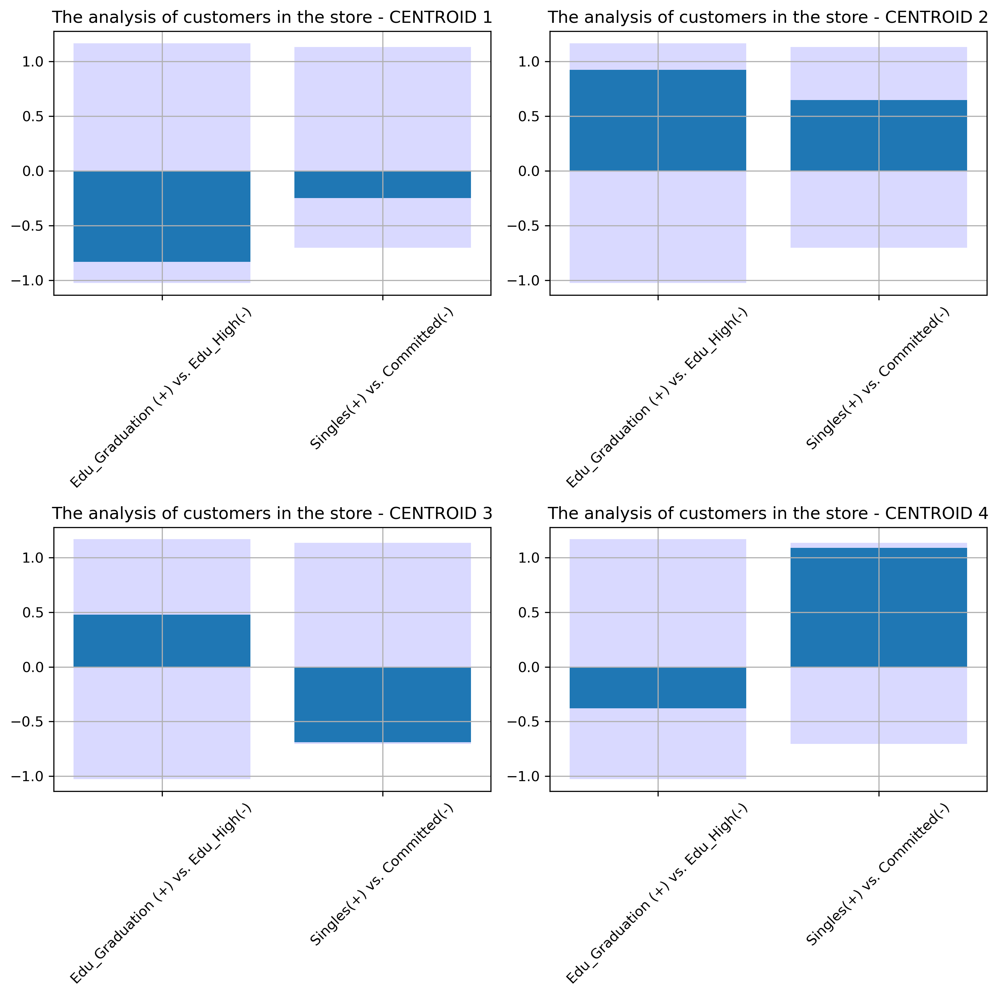

In [152]:
# COMPUTE THE MAX/MIN VALUES IN THE PC-SPACE
maxs_y = Y_mm.max(axis=0)
mins_y = Y_mm.min(axis=0)

# MAKE THE BARPLOTS OF THE CENTROIDS
fig_centroids, ax_centroids = plt.subplots(2, 2, figsize=(10, 10), dpi=300)
for ii in range(4):
    ir = ii // 2
    ic = ii % 2
    ax_centroids[ir, ic].bar(np.arange(km.cluster_centers_.shape[1]), maxs_y, color='blue', alpha=0.15)
    ax_centroids[ir, ic].bar(np.arange(km.cluster_centers_.shape[1]), mins_y, color='blue', alpha=0.15)
    ax_centroids[ir, ic].bar(np.arange(km.cluster_centers_.shape[1]), km.cluster_centers_[ii, :])
    ax_centroids[ir, ic].set_xticks(ticks=np.arange(km.cluster_centers_.shape[1]))
    ax_centroids[ir, ic].set_xticklabels(labels=pc_names_mm, rotation=45)
    ax_centroids[ir, ic].grid(visible=True, which='both')
    plt.tight_layout()
    ax_centroids[ir, ic].set_title(f'The analysis of customers in the store - CENTROID {ii+1}')

In [153]:

# Calculate the silhouette values for each sample
sample_silhouette_values = silhouette_samples(Y_mm, km.labels_)

# Initialize an empty list to store mean silhouette scores for each cluster
means_lst = []

# Loop over each unique cluster label
for label in np.unique(km.labels_):
    # Calculate the mean silhouette score for the current cluster
    mean_silhouette = sample_silhouette_values[km.labels_ == label].mean()
    # Append the mean silhouette score to the list
    means_lst.append(mean_silhouette)

# Convert the list of mean silhouette scores to a DataFrame for better visualization
mean_silhouette_df = pd.DataFrame(means_lst, columns=['Mean Silhouette']).round(3)

# Display the DataFrame
print(mean_silhouette_df)

   Mean Silhouette
0            0.876
1            0.916
2            0.912
3            0.852


### Observations: 

In comparison to the dataset which was scaled using the standardized scaler, the version using min-max scaling divides the data also visually in 4 clear clusters, which seem to be relatively far from one another and given the visualization, with a high density of data in the same small spaces. Thus, it comes as no surprise that also k-means identifies those 4 clusters and that the mean silhouette score per cluster is very high, between 0.85 and 0.91, approximating the upper boundary 1. 
The four clusters that are created are the following:

1. <span style="color:blue"> Centroid 1 - cluster 1 </span>: as it can be seen also in the bar plots, the first cluster is very much composed of people who are single and have the education graduation. So, we can label it "single graduation edu people".

2. <span style="color:red"> Centroid 2 - cluster 2 </span> : this second cluster is also determined by high values of people which have education graduation (though to a lower extent than the first cluster) and that in this case are commited. So, we can label it "graduation level committed people".

3. <span style ="color:green"> Centroid 3 - cluster 3 </span>: the third centroid and by extension the third cluster is largely determined by PC1, so this is a group of people with education level high to very large numbers and that are relatively indifferent to their relationship status but with a slight bias towards committment. We can consider this the "highly educated committed people".

4. <span style ="color:orange"> Centroid 4 - cluster 4 </span>: we observe that this centroid has very large numbers with respect to pc2, so it is the relationship status that mostly determines this group as singles and a slight bias in PC1 towards education high. We can consider this "highly educated single people".



In [154]:
cluster_names = [ "single graduation edu people", 
                 "graduation level commited people", 
                 "highly educated commited people",
                  "highly educated single people"]                

### 5.2.2 Score graphs post clustering

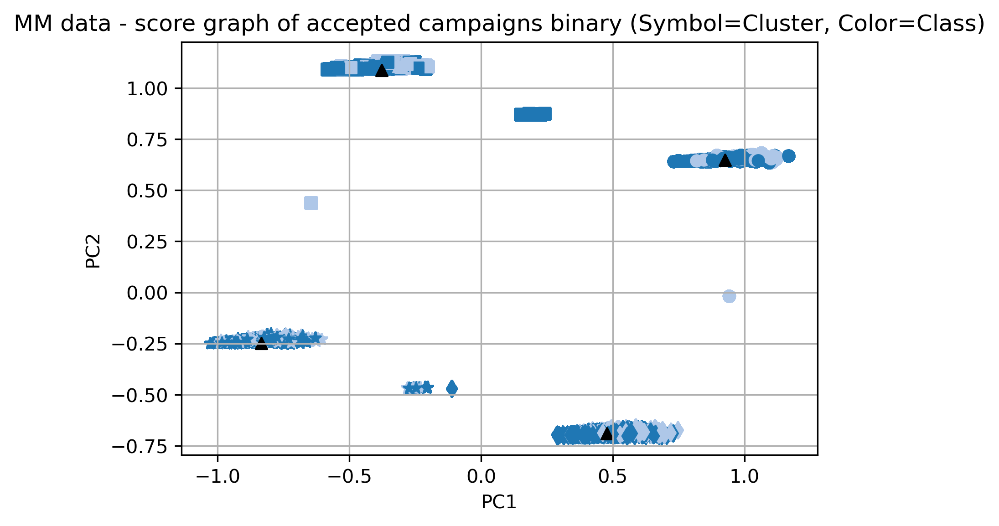

In [155]:
markers_dict = {0: '*', 1: 'o', 2: 'd', 3: 's'}
colors = cm.tab20.colors

plt.figure(dpi=300)
for ll in km.labels_:
    plt.scatter(Y_mm[km.labels_ == ll, 0], Y_mm[km.labels_ == ll, 1], c=[colors[ii] for ii in workdf_cp['Accepted_Campaigns'].values[km.labels_ == ll]], marker=markers_dict[ll])
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], c='black', marker='^')
plt.title('MM data - score graph of accepted campaigns binary (Symbol=Cluster, Color=Class)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid()
plt.show()

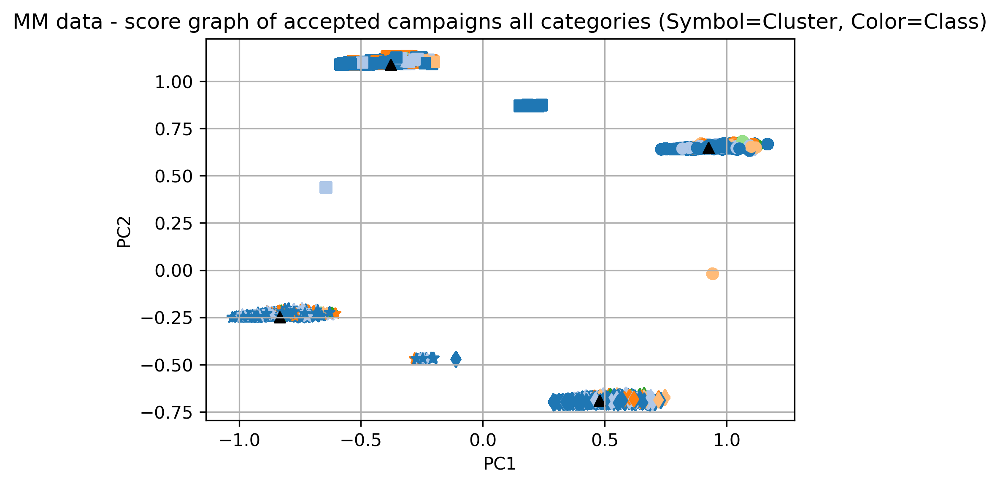

In [156]:
plt.figure(dpi=300)
for ll in km.labels_:
    plt.scatter(Y_mm[km.labels_ == ll, 0], Y_mm[km.labels_ == ll, 1], c=[colors[ii] for ii in workdf_cp['Accepted_Campaigns2'].values[km.labels_ == ll]], marker=markers_dict[ll])
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], c='black', marker='^')
plt.title('MM data - score graph of accepted campaigns all categories (Symbol=Cluster, Color=Class)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid()
plt.show()

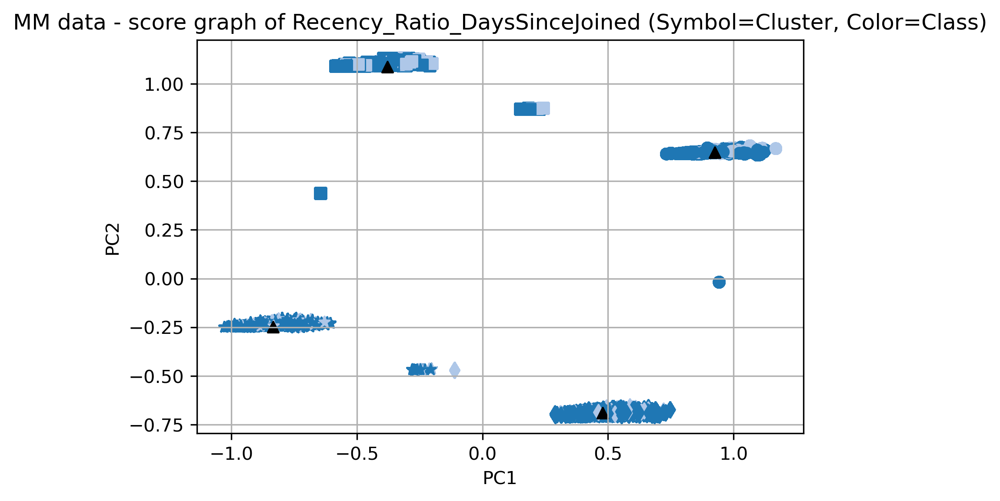

In [157]:
plt.figure(dpi=300)
for ll in km.labels_:
    plt.scatter(Y_mm[km.labels_ == ll, 0], Y_mm[km.labels_ == ll, 1], c=[colors[ii] for ii in workdf_cp['Recency_Ratio_DaysSinceJoined'].values[km.labels_ == ll]], marker=markers_dict[ll])
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], c='black', marker='^')
plt.title('MM data - score graph of Recency_Ratio_DaysSinceJoined (Symbol=Cluster, Color=Class)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid()
plt.show()

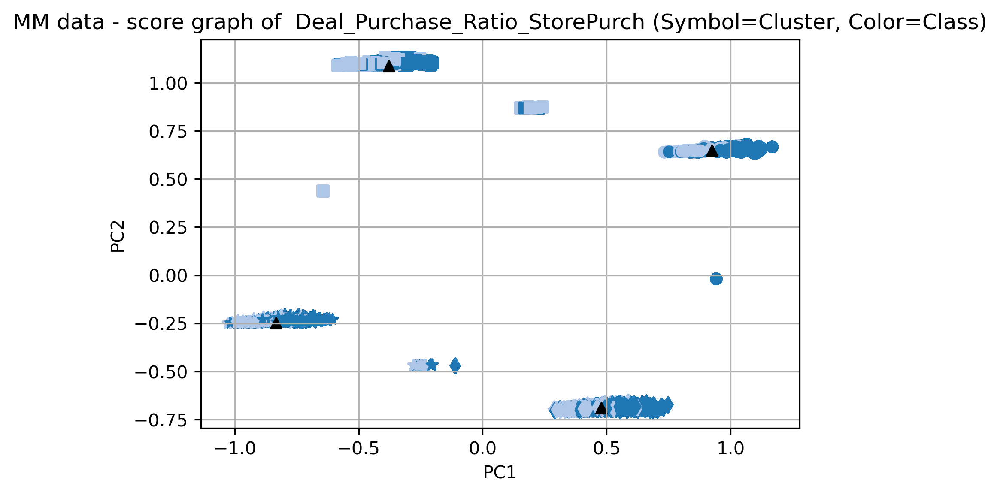

In [158]:
plt.figure(dpi=300)
for ll in km.labels_:
    plt.scatter(Y_mm[km.labels_ == ll, 0], Y_mm[km.labels_ == ll, 1], c=[colors[ii] for ii in workdf_cp['Deal_Purchase_Ratio_StorePurch'].values[km.labels_ == ll]], marker=markers_dict[ll])
plt.scatter(km.cluster_centers_[:, 0], km.cluster_centers_[:, 1], c='black', marker='^')
plt.title('MM data - score graph of  Deal_Purchase_Ratio_StorePurch (Symbol=Cluster, Color=Class)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.grid()
plt.show()

### Observations:

We cannot observe some clear distinction of the data labels with respect to the clusters made by the k-means. They are all composed of the different labels.

### 5.3.3 External evaluation

In [159]:
km.labels_

array([2, 2, 3, ..., 2, 1, 2])

In [160]:
k

4

#### A. Recency Frequency Count

In [161]:
mask_clusters = [km.labels_ == ii for ii in range(k)]
cluster_genpos = [dict(workdf_cp.loc[mask_clusters[ii], 'RecencyRange'].value_counts()) for ii in range(k)]


In [162]:
bin_labels = ['0-30',
    '31-60',
    '61-90',
    '91-120']

In [163]:
maxcount = max([max(cluster_genpos[kk].values()) for kk in range(len(cluster_genpos))])
print("Max count:", maxcount)

Max count: 150


In [164]:
print(cluster_genpos)

[{'61-90': 146, '0-30': 145, '31-60': 133, '91-120': 42}, {'31-60': 88, '61-90': 84, '0-30': 75, '91-120': 27}, {'0-30': 150, '31-60': 147, '61-90': 128, '91-120': 50}, {'0-30': 75, '31-60': 75, '61-90': 74, '91-120': 20}]


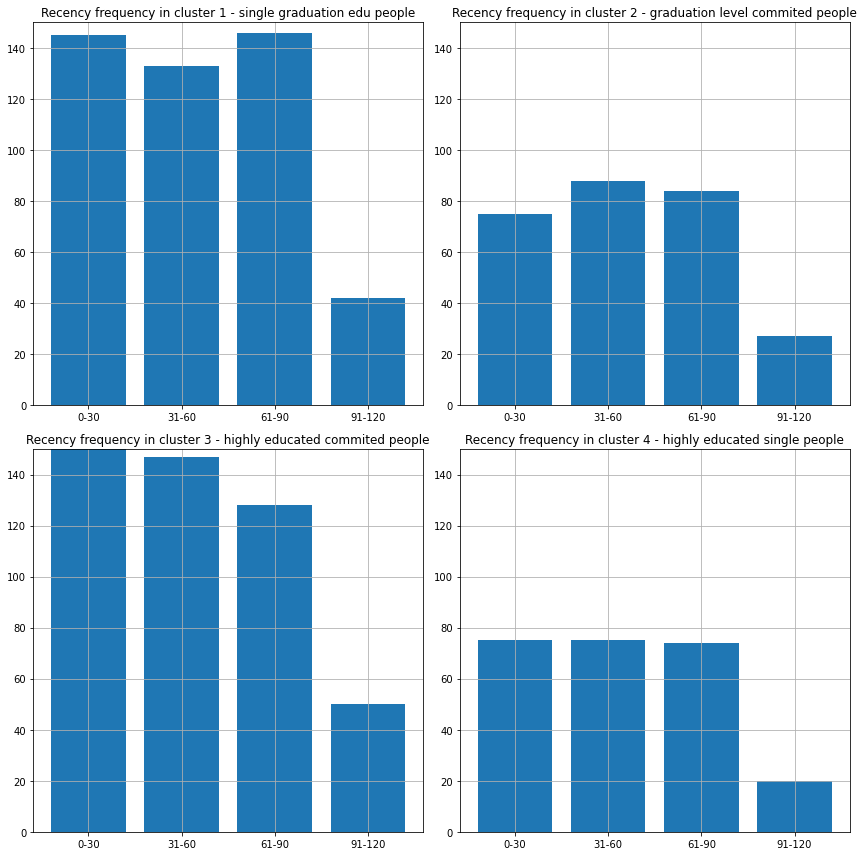

In [165]:
# Create a 2x2 grid of subplots (2 rows, 2 columns)
fig_centroids, ax_centroids = plt.subplots(2, 2, figsize=(12, 12))

# Flatten the 2D array of axes for easier iteration
ax_centroids = ax_centroids.flatten()

# Plot the data for each cluster
for ii in range(len(cluster_genpos)):  # k is 4 in your case
    bar_heights = [cluster_genpos[ii].get(bb, 0) for bb in bin_labels]
    
    ax_centroids[ii].bar(bin_labels, bar_heights)
    
    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount])
    
    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Recency frequency in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

In [166]:
mask_clusters = [km.labels_ == ii for ii in range(k)]
cluster_genpos = [dict(workdf_cp.loc[mask_clusters[ii], 'Recency_Ratio_DaysSinceJoined'].value_counts()) for ii in range(k)]


In [167]:
cluster_genpos

[{0: 395, 1: 71}, {0: 231, 1: 43}, {0: 407, 1: 68}, {0: 206, 1: 38}]

In [168]:
bin_labels = [0, 1]

In [169]:
maxcount = max([max(cluster_genpos[kk].values()) for kk in range(len(cluster_genpos))])
print("Max count:", maxcount)

Max count: 407


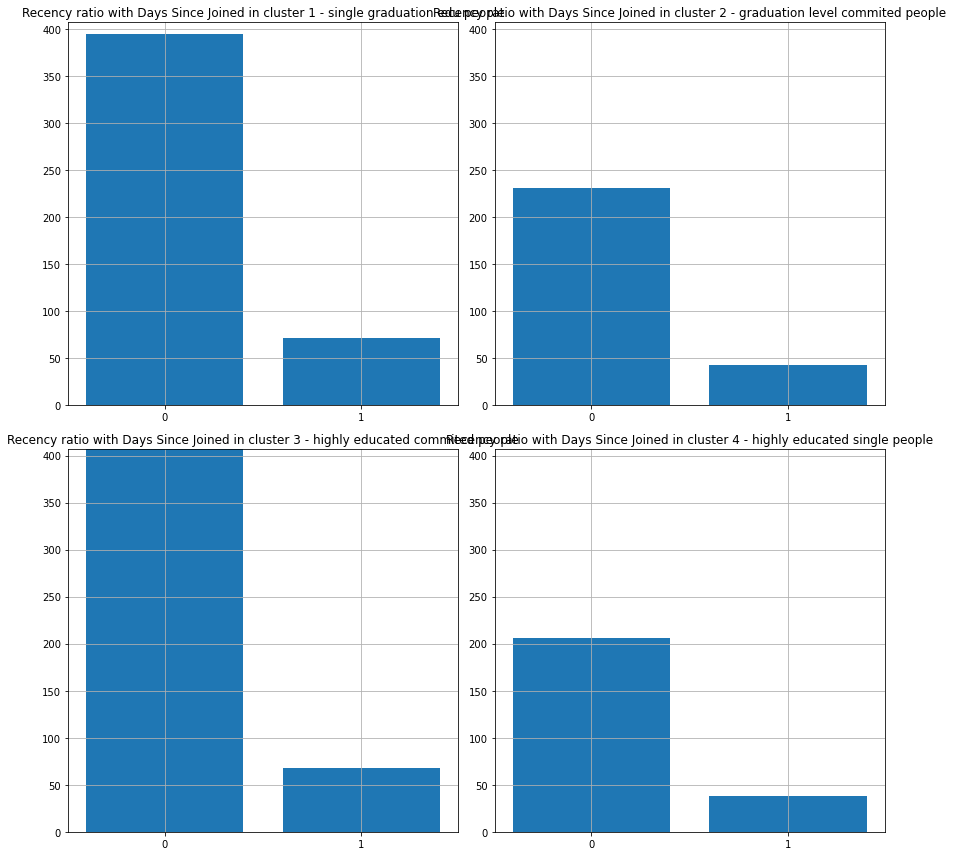

In [170]:
# Create a 2x2 grid of subplots (2 rows, 2 columns)
fig_centroids, ax_centroids = plt.subplots(2, 2, figsize=(12, 12))

# Flatten the 2D array of axes for easier iteration
ax_centroids = ax_centroids.flatten()

# Plot the data for each cluster
for ii in range(len(cluster_genpos)):  # k is 4 in your case
    bar_heights = [cluster_genpos[ii].get(bb, 0) for bb in bin_labels]
    
    ax_centroids[ii].bar(bin_labels, bar_heights)
    
    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount])
    
    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels7)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels7)  # Ensure labels match the tick positions
    
    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Recency ratio with Days Since Joined in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

#### B. Accepted Campaigns both versions Frequency Counts

In [171]:
mask_clusters = [km.labels_ == ii for ii in range(k)]
cluster_genpos = [dict(workdf_cp.loc[mask_clusters[ii], 'Accepted_Campaigns'].value_counts()) for ii in range(k)]


In [172]:
cluster_genpos

[{0: 353, 1: 113}, {0: 190, 1: 84}, {0: 354, 1: 121}, {0: 156, 1: 88}]

In [173]:
maxcount = max([max(cluster_genpos[kk].values()) for kk in range(len(cluster_genpos))])
print("Max count:", maxcount)

Max count: 354


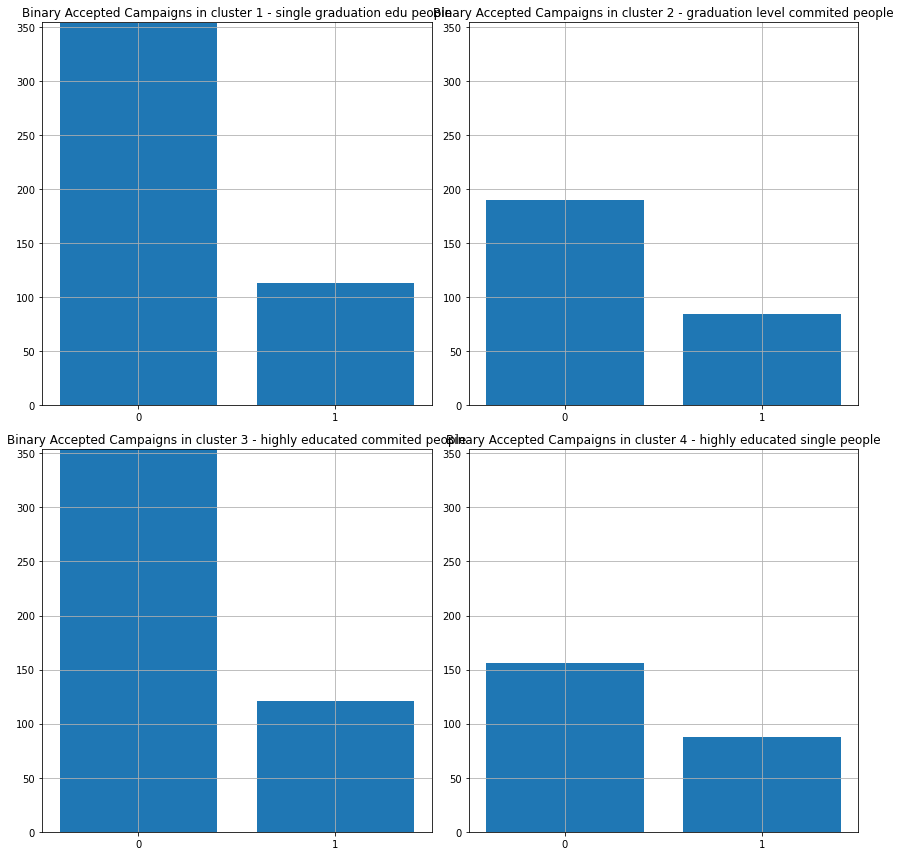

In [174]:
# Create a 2x2 grid of subplots (2 rows, 2 columns)
fig_centroids, ax_centroids = plt.subplots(2, 2, figsize=(12, 12))

# Flatten the 2D array of axes for easier iteration
ax_centroids = ax_centroids.flatten()

# Plot the data for each cluster
for ii in range(len(cluster_genpos)):  # k is 4 in your case
    bar_heights = [cluster_genpos[ii].get(bb, 0) for bb in bin_labels]
    
    ax_centroids[ii].bar(bin_labels, bar_heights)
    
    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount])
    
    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels7)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels7)  # Ensure labels match the tick positions
    
    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Binary Accepted Campaigns in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

In [175]:
mask_clusters = [km.labels_ == ii for ii in range(k)]
cluster_genpos = [dict(workdf_cp.loc[mask_clusters[ii], 'Accepted_Campaigns2'].value_counts()) for ii in range(k)]

In [176]:
cluster_genpos

[{0: 353, 1: 68, 2: 29, 3: 8, 4: 7, 5: 1},
 {0: 190, 1: 50, 2: 18, 3: 8, 4: 6, 5: 2},
 {0: 354, 1: 83, 2: 18, 3: 10, 4: 9, 5: 1},
 {0: 156, 1: 54, 2: 23, 3: 9, 4: 1, 5: 1}]

In [177]:
maxcount = max([max(cluster_genpos[kk].values()) for kk in range(len(cluster_genpos))])
print("Max count:", maxcount)

Max count: 354


In [178]:
bin_labels = [0, 1,2,3,4,5]

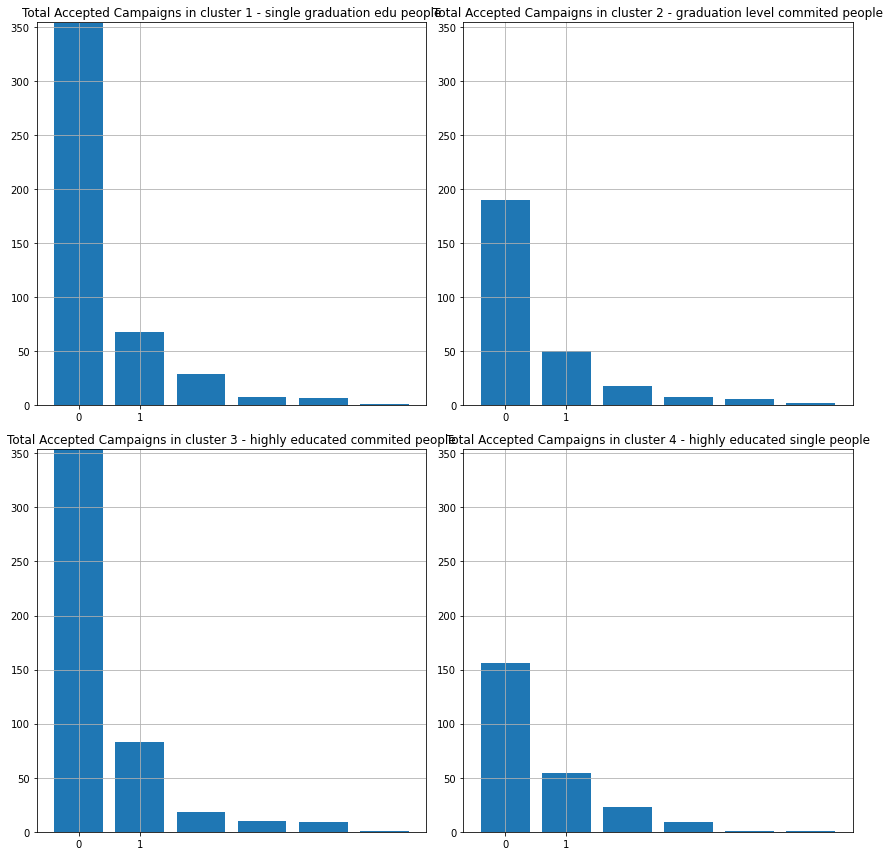

In [179]:
# Create a 2x2 grid of subplots (2 rows, 2 columns)
fig_centroids, ax_centroids = plt.subplots(2, 2, figsize=(12, 12))

# Flatten the 2D array of axes for easier iteration
ax_centroids = ax_centroids.flatten()

# Plot the data for each cluster
for ii in range(len(cluster_genpos)):  # k is 4 in your case
    bar_heights = [cluster_genpos[ii].get(bb, 0) for bb in bin_labels]
    
    ax_centroids[ii].bar(bin_labels, bar_heights)
    
    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount])
    
    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels7)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels7)  # Ensure labels match the tick positions
    
    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Total Accepted Campaigns in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

#### C. Ratios with NumDeals

In [180]:
cluster_genpos7 = [dict(workdf_cp.loc[mask_clusters[ii], 'Deal_Purchase_Ratio_StorePurch'].value_counts()) for ii in range(k)]
cluster_genpos7

[{0: 244, 1: 222}, {0: 152, 1: 122}, {0: 260, 1: 215}, {0: 123, 1: 121}]

In [181]:
bin_labels7 = [0, 1]

In [182]:
maxcount7 = max([max(cluster_genpos7[kk].values()) for kk in range(len(cluster_genpos7))])
print("Max count:", maxcount7)

Max count: 260


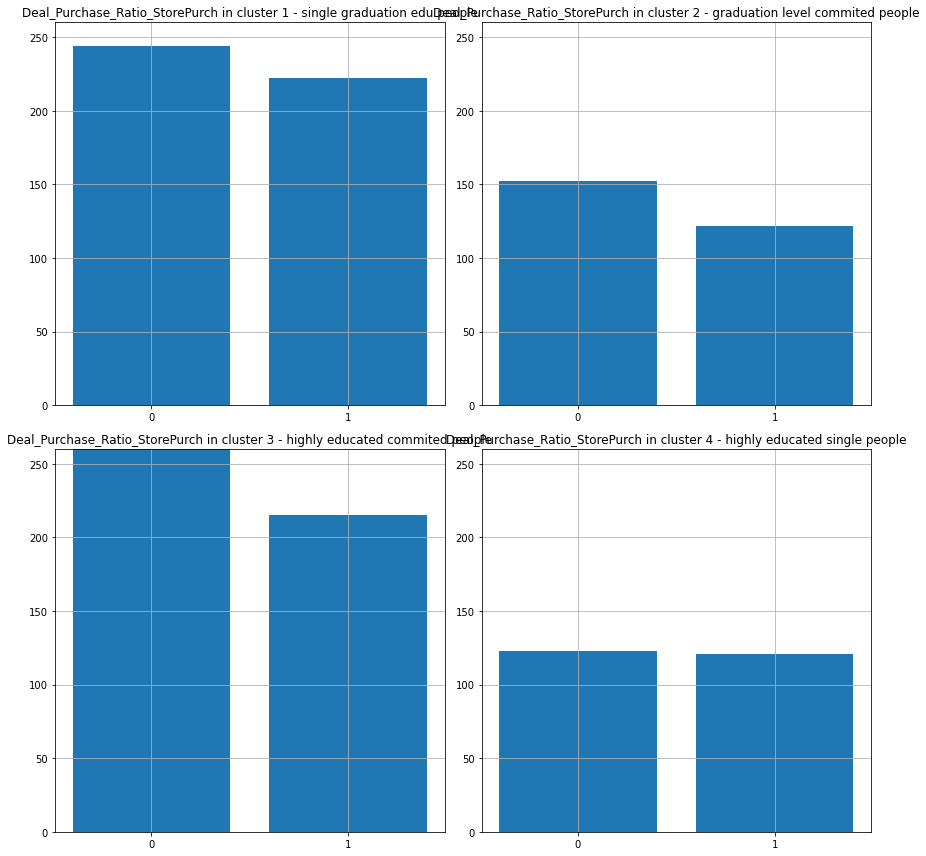

In [183]:
# Create a 2x2 grid of subplots (2 rows, 2 columns)
fig_centroids, ax_centroids = plt.subplots(2, 2, figsize=(12, 12))

# Flatten the 2D array of axes for easier iteration
ax_centroids = ax_centroids.flatten()

# Plot the data for each cluster
for ii in range(len(cluster_genpos7)):  # k is 4 in your case
    bar_heights = [cluster_genpos7[ii].get(bb, 0) for bb in bin_labels7]
    
    ax_centroids[ii].bar(bin_labels7, bar_heights)
    
    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount7])
    
    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels7)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels7)  # Ensure labels match the tick positions
    
    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Deal_Purchase_Ratio_StorePurch in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

In [184]:
cluster_genpos7 = [dict(workdf_cp.loc[mask_clusters[ii], 'Deal_Purchase_Ratio_WebPurch'].value_counts()) for ii in range(k)]
cluster_genpos7

[{0: 259, 1: 207}, {0: 164, 1: 110}, {0: 275, 1: 200}, {0: 130, 1: 114}]

In [185]:
maxcount7 = max([max(cluster_genpos7[kk].values()) for kk in range(len(cluster_genpos7))])
print("Max count:", maxcount7)

Max count: 275


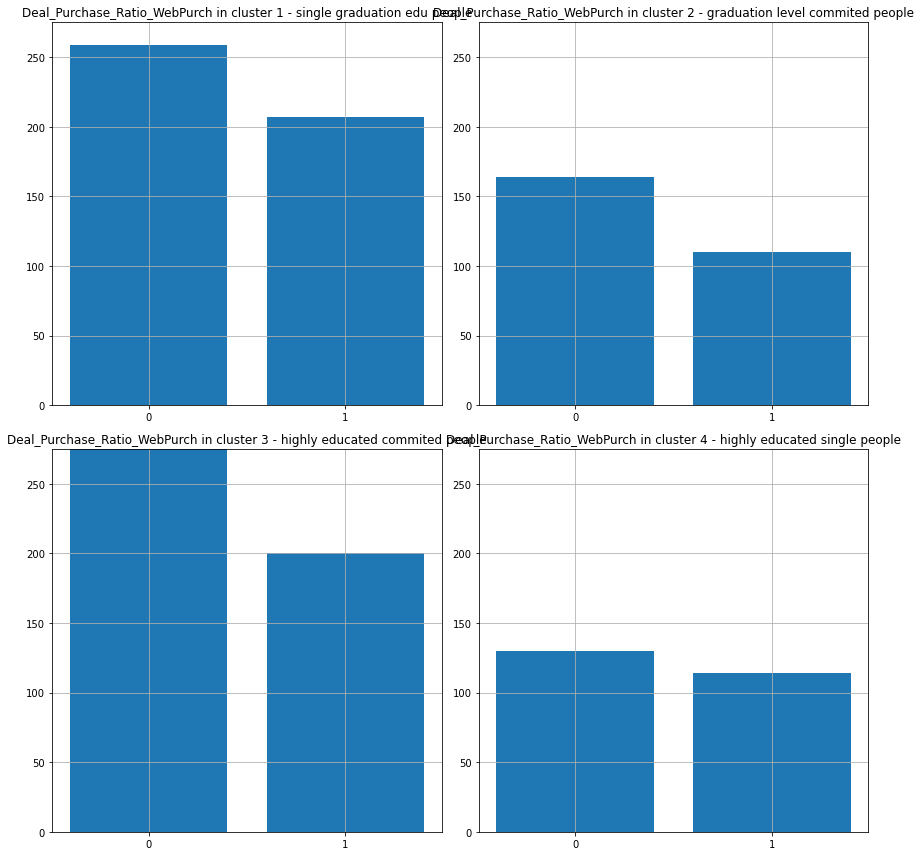

In [186]:
# Create a 2x2 grid of subplots (2 rows, 2 columns)
fig_centroids, ax_centroids = plt.subplots(2, 2, figsize=(12, 12))

# Flatten the 2D array of axes for easier iteration
ax_centroids = ax_centroids.flatten()

# Plot the data for each cluster
for ii in range(len(cluster_genpos7)):  # k is 4 in your case
    bar_heights = [cluster_genpos7[ii].get(bb, 0) for bb in bin_labels7]
    
    ax_centroids[ii].bar(bin_labels7, bar_heights)
    
    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount7])
    
    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels7)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels7)  # Ensure labels match the tick positions
    
    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Deal_Purchase_Ratio_WebPurch in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

In [187]:
cluster_genpos7 = [dict(workdf_cp.loc[mask_clusters[ii], 'Deal_Purchase_Ratio_CatPurch'].value_counts()) for ii in range(k)]
cluster_genpos7

[{0: 346, 1: 120}, {0: 202, 1: 72}, {0: 358, 1: 117}, {0: 175, 1: 69}]

In [188]:
maxcount7 = max([max(cluster_genpos7[kk].values()) for kk in range(len(cluster_genpos7))])
print("Max count:", maxcount7)

Max count: 358


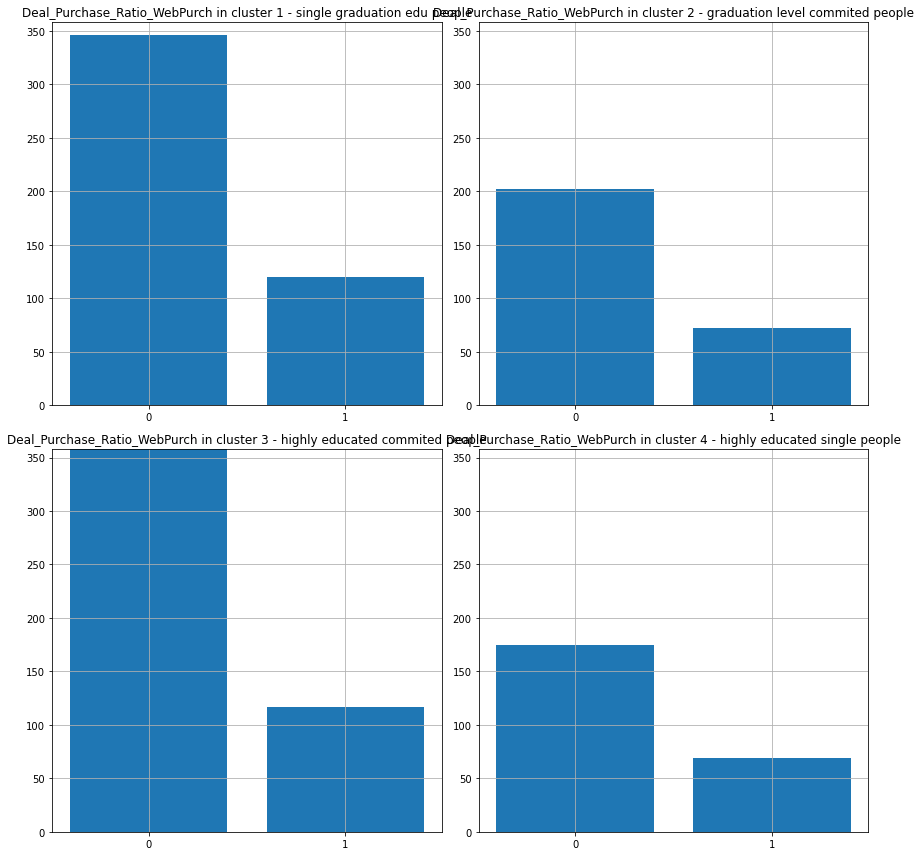

In [189]:
# Create a 2x2 grid of subplots (2 rows, 2 columns)
fig_centroids, ax_centroids = plt.subplots(2, 2, figsize=(12, 12))

# Flatten the 2D array of axes for easier iteration
ax_centroids = ax_centroids.flatten()

# Plot the data for each cluster
for ii in range(len(cluster_genpos7)):  # k is 4 in your case
    bar_heights = [cluster_genpos7[ii].get(bb, 0) for bb in bin_labels7]
    
    ax_centroids[ii].bar(bin_labels7, bar_heights)
    
    # Correctly set y-axis limit
    ax_centroids[ii].set_ylim([0, maxcount7])
    
    # Set x-axis ticks to only show 0 and 1
    ax_centroids[ii].set_xticks(bin_labels7)  # Set the tick positions to match the bin labels
    ax_centroids[ii].set_xticklabels(bin_labels7)  # Ensure labels match the tick positions
    
    ax_centroids[ii].grid(True, which='both')
    ax_centroids[ii].set_title(f'Deal_Purchase_Ratio_WebPurch in cluster {ii+1} - {cluster_names[ii]}')

plt.tight_layout()
plt.show()

### Observations: 

<ul>
  <li> Recency & recency ratio: nothing can really be observed here in terms of clusters separating the data in a meaningful way.</li>
  <li>Accepted Campaigns: for the binary case, the store managers have a better chance at directing campaigns to single shoppers, wether they are in "high education" or "graduation education", than to the other two groups, but always even in these two groups, the probability is higher for the campaign not to be accepted than to be accepted.   </li>
  <li> Num of Deals Purchases and respective ratios: in all three ratios, the single highly educated group, is the one that has a more balanced distribution, with a slight advantage for 0. Thus, perhaps, this would be the best group to be targetted for future deals.</li>
</ul>

# <center> <span style="color:red">  6. Final Comparison of Results between Std_df and MM_df and respective clusters </span> </center>

For the standardized case, pcs are determined mainly by income, purchasing amount, number of web visits and children at home. For the min-max scaled case, pcs are determined mainly by martial status and education. The two different versions of the dataset, create very different clusters. In the second case, the siluhette score is much higher, approximating 1 in some cases. However, neither of the two clusters really spearate the data well when we want to analyze them in terms of the labels. Perhaps, the first clustering, so the standardized case, does a much better job than the second. 

<center> End of Assignement </center>
<hr>